# Title of Your Group Project

This Python notebook serves as a template for your group project on Experiment 2: *Task switching with letters and numbers* for the course 'Modeling in Cognitive Science'.
This is the practical part of the group project where you get to implement the computational modeling workflow. In this part, you are expected to:


*   Implement at least two computational models relevant for your hypothesis. *(3 points)*
*   Simulate behavior from the two models. *(3 points)*
*   Implement a procedure for fitting the models to data. *(4 points)*
*   Implement a procedure for parameter recovery. *(5 points)*
*   (Implement a procedure for model recovery.) *(optional; 2 bonus points)*
*   Implement a model comparison. *(5 points)*.

You can gain a total of 20 points for the practical part of the group project.

**Note:** *Some of the exercises below (e.g. Model Simulation) rely on code from previous exercises (e.g., Model Implementation). In such cases, you are encouraged to rely on functions implemented for previous exercises. That is, you don't have to produce redundant code.*


For more information, you can check the task's GitHub repository:
[task switching with letter and numbers](https://github.com/snamazova/task_switch)


## Data Loading


In [1]:
# #Optional: Checking specs to see where to run the code
# from utils import print_cpu_specs
# print_cpu_specs()

In [2]:
import json
import os
import pandas as pd
import matplotlib.pyplot as plt
plt.rcParams.update({'font.size': 18, 'font.family': "sans-serif"}) # 'font.weight': 'bold'

from data_cleaning import clean_data

In [3]:
COLAB = False
if os.getenv("COLAB_RELEASE_TAG"):
   print("Running in Colab")
   !pip install ipywidgets
   !pip install git+https://github.com/lnccbrown/HSSM.git
   !git clone https://github.com/esmeralda-25/DynamicalSystemsModelling_TS
   from google.colab import files
   import hssm
   import hssm.plotting
   import sys
   os.chdir("/content/DynamicalSystemsModelling_TS")
   sys.path.append("/content/repository_name")

   COLAB = True
   
else:
   print("NOT in Colab")
   print('repo files:', os.listdir())
   !ls -lah

NOT in Colab
repo files: ['TheOriginal copy.ipynb', 'parameter_recovery.py', '.gitignore', 'TheOriginal.ipynb', 'TheOriginal_Hendrik.ipynb', 'README.md', 'model.py', 'plots', 'data', 'data_cleaning.py', 'env_requirements', 'model_comparison.py', '__pycache__', 'model_recovery.py', 'analysis.py', 'model_simulation.py', 'utils.py', '.git', 'data_cleaned', 'parameter_fitting.py']
total 23M
drwxrwxr-x 8 mj mj 4.0K Mar 15 10:42  .
drwxrwxr-x 4 mj mj 4.0K Mar 14 17:30  ..
-rw-rw-r-- 1 mj mj 6.4K Mar 14 15:07  analysis.py
drwxrwxr-x 2 mj mj 4.0K Mar 15 10:33  data
drwxrwxr-x 2 mj mj 4.0K Mar 15 11:35  data_cleaned
-rw-rw-r-- 1 mj mj 3.6K Mar 11 17:00  data_cleaning.py
drwxrwxr-x 2 mj mj 4.0K Mar 11 17:00  env_requirements
drwxrwxr-x 8 mj mj 4.0K Mar 15 10:54  .git
-rw-rw-r-- 1 mj mj 3.4K Mar 15 10:31  .gitignore
-rw-rw-r-- 1 mj mj 2.9K Mar 15 12:04  model_comparison.py
-rw-rw-r-- 1 mj mj 6.2K Mar 15 10:51  model.py
-rw-rw-r-- 1 mj mj 6.0K Mar 14 17:26  model_recovery.py
-rw-rw-r-- 1 mj mj 9.4

In [4]:
# upload the file manually
file_name = "data/example.json"
if COLAB:
    uploaded = files.upload()
    # get the filename from the uploaded dictionary
    file_name = list(uploaded.keys())[0]

# open and load the JSON file
with open(file_name, "r") as f:
    data = json.load(f)

# convert JSON to a DataFrame
df_raw = pd.json_normalize(data)

# display the DataFrame columns to analyze it
print(df_raw.columns)
df_raw.head(1)

Index(['rt', 'stimulus', 'response', 'trial_type', 'trial_index',
       'time_elapsed', 'internal_node_id', 'bean_trial_duration',
       'bean_duration', 'bean_stimulus', 'bean_choices', 'bean_correct_key',
       'bean_type', 'bean_text', 'bean_color', 'bean_correct',
       'bean_num_correct', 'bean_accuracy', 'bean_task_type'],
      dtype='object')


,rt,stimulus,response,trial_type,trial_index,time_elapsed,internal_node_id,bean_trial_duration,bean_duration,bean_stimulus,bean_choices,bean_correct_key,bean_type,bean_text,bean_color,bean_correct,bean_num_correct,bean_accuracy,bean_task_type
0,648.0,<div style='color:white'>Welcome to our task-s...,,html-keyboard-response,0,649,0.0-0.0-0.0,NaN,NaN,<div style='color:white'>Welcome to our task-s...,[ ],,jsPsychHtmlKeyboardResponse,Welcome to our task-switching experiment.What ...,white,False,NaN,NaN,NaN


### DataFrame Structure Overview

The DataFrame contains multiple columns representing various aspects of a **task-switching experiment**. Below is a breakdown of the key columns:  

## 1. General Trial Information  
- **`trial_index`**: The index of the current trial in the experiment(feedback is also considered as trial)  
- **`trial_type`**: The type of trial, indicating how the response was made (e.g., via keyboard or mouse click).  
- **`time_elapsed`**: The total time elapsed (in milliseconds) since the start of the experiment.  
- **`internal_node_id`**: An internal identifier for the trial structure.  

## 2. Response and Stimulus Data  
- **`stimulus`**: The presented stimulus for the trial.  
- **`response`**: The participant’s response/input during the trial.  
- **`rt`**: The reaction time (in milliseconds) taken to respond.  

## 3. Task-Specific Information (Task-Switching Task)   
- **`bean_trial_duration`**: The duration of the bean trial  
- **`bean_duration`**: The time the bean stimulus was displayed (with a maximum duration of 2000ms; if no response is given within this time, the trial automatically switches to the next one and is considered incorrect).
- **`bean_stimulus`**: The presented stimulus for the trial.  
- **`bean_choices`**: The available choice options in the trial.  
- **`bean_correct_key`**: The correct key (button press) for the task.  
- **`bean_type`**: The category of the bean stimulus, determined by how the participant responded (e.g., clicking or pressing a key)
- **`bean_text`**: A text representation of the bean (stimulus is inside `div` tag).  
- **`bean_color`**: The color of the bean
- **`bean_correct`**: A boolean or categorical value indicating whether the response was correct.  
- **`bean_num_correct`**: The number of correct responses across trials.  
- **`bean_accuracy`**: The participant's accuracy in the task, typically computed as the proportion of correct responses.  
- **`bean_task_type`**: The type of task being performed within the task-switching paradigm(letter or number task)


In [5]:
data_cleaned = clean_data(df_raw)
# data_cleaned.head(5)
data_cleaned.tail(5)

 data cleaning done. number of valid trails: 93


,task,trial_type,response,accuracy,choice_adjusted,rt,switch,participant_response,correct_key,key_choices,stimuli
88,letter,switch,1,0.887640,0,2.270,1,n,n,"[b, n]",E2
89,number,switch,1,0.888889,1,2.280,1,b,b,"[b, n]",K9
90,letter,switch,1,0.890110,0,1.741,1,n,n,"[b, n]",A2
91,letter,repeat,1,0.891304,0,0.857,0,b,b,"[b, n]",G5
92,letter,repeat,1,0.892473,0,0.921,0,n,n,"[b, n]",U6


In [6]:
# # save to csv file, with a unique timeestamp
# import datetime
# timestamp = datetime.datetime.now().strftime("%m%d_%H%M")
# # create folder data_cleaned if it does not exist
# directory = "data_cleaned"
# os.makedirs(directory, exist_ok=True)
# filename = f"data_cleaned_{timestamp}.csv"
# data_cleaned.to_csv(os.path.join(directory, filename), index=False)

# # download the saved csv
# if COLAB:
#     files.download(filename)

In [ ]:
#accuracy plotten
plt.figure(figsize=(10, 6))
plt.plot(data_cleaned["trial_index"], data_cleaned["accuracy"], label="accuracy")
plt.title("Overall Accuracy")
plt.xlabel("Trial Index")
plt.ylabel("Accuracy")

#accuracy nur mit switch trials plotten

plt.figure(figsize=(10, 6))

switch_data = data_cleaned[data_cleaned["trial_type"] == "switch"]

switch_data = switch_data.set_index("trial_index").reindex(data_cleaned["trial_index"]).ffill().reset_index()

plt.plot(switch_data["trial_index"], switch_data["accuracy"], label="accuracy")
plt.title("Accuracy (Switch Trials)")
plt.xlabel("Trial Index")
plt.ylabel("Accuracy")
plt.legend()
plt.show()

#accuracy nur mit repeat trials plotten

plt.figure(figsize=(10, 6))

repeat_data = data_cleaned[data_cleaned["trial_type"] == "repeat"]

repeat_data = repeat_data.set_index("trial_index").reindex(data_cleaned["trial_index"]).ffill().reset_index()

plt.plot(repeat_data["trial_index"], repeat_data["accuracy"], label="accuracy")
plt.title("Accuracy (Repeat Trials)")
plt.xlabel("Trial Index")
plt.ylabel("Accuracy")

plt.legend()
plt.show()
# moin moin 


## Model Implementation *(3 points)*

For this exercise you should:

*   Implement and simulate data from two* models that are suitable to test your hypothesis. *(3 points)*

<font size=2>*You may implement more than two models if you wish. However, two models are sufficient for this group project.</font>

Make sure to comment your code and provide an explanation for each code block in a preceding text block.


### Model Formulation

### Insight into the latent varaibles in a simulation on one trial

In [7]:
import numpy as np
import matplotlib.pyplot as plt
from model import simulate_dynamics, plot_trajectory

In [8]:
from ipywidgets import interact, widgets

def interactive_plot_trial(g, alpha, gamma, x1_0, x2_0, P_0, feedback, tau_P):
    I1 = 1        # Input to task 1
    I2 = 0        # Input to task 2
    sigma = 0.4    # noise
    T = 8         # Simulation time

    x_0 = [x1_0, x2_0, P_0]

    input = [I1, I2]
    np.random.seed(0)

    # Run the simulationnear
    ts, x1, x2, P  = simulate_dynamics(T, x_0, g, alpha, gamma, input, feedback, sigma, tau_P,num_sample_points=100)

    # Plot the trajectory
    plt.close('all')
    plot_trajectory(T, ts, x1, x2, P, input=[np.where(np.array(input) != 1)[0][0]], feedback=[feedback])

# Create interactive sliders
g_slider = widgets.FloatSlider(value=1.5, min=0.0, max=5.0, step=0.5, description="Gain (g):")
alpha_slider = widgets.FloatSlider(value=0.1, min=-1.0, max=1.0, step=0.1, description="alpha:")
gamma_slider = widgets.FloatSlider(value=0.3, min=-1.0, max=1.0, step=0.1, description="gamma:")
x1_0_slider = widgets.FloatSlider(value=0.5, min=0.0, max=1.0, step=0.1, description="x1_0:")
x2_0_slider = widgets.FloatSlider(value=0.5, min=0.0, max=1.0, step=0.1, description="x2_0:")
P_0_silder = widgets.FloatSlider(value=0.0, min=-1.0, max=1.0, step=0.1, description="P_0:")
tau_P_slider = widgets.FloatSlider(value=1.0, min=0.0, max=1.0, step=0.1, description="tau_P:")
feedback_slider = widgets.IntSlider(value=-1, min=-1, max=1, step=1, description="Feedback:")

# Use the interact function to create the interactive plot
interact(interactive_plot_trial, g=g_slider, alpha=alpha_slider, gamma=gamma_slider ,
         x1_0=x1_0_slider, x2_0=x2_0_slider, P_0=P_0_silder, feedback=feedback_slider, tau_P=tau_P_slider);
plt.close('all')

interactive(children=(FloatSlider(value=1.5, description='Gain (g):', max=5.0, step=0.5), FloatSlider(value=0.…

## Model Simulation *(3 points)*

For this exercise you should:

*   Simulate data from both models for a single set of parameters. The simulation should mimic the experiment you are trying to model. *(2 points)*

*   Plot the simulated behavior of both models. The model plots should depict key features of the behavioral data, convincing yourself that the models are suitable to capture the data. *(1 point)*

Make sure to comment your code and provide an explanation for each code block in a preceding text block.


In [9]:
from model_simulation import simulate_experiment, generate_experiment_trials
from analysis import calculate_accuracy_per_condition, plot_accuracy_per_condition


### Insight into the Dynamics of the two Models across multiple trails

In [10]:
from ipywidgets import interact, widgets
def interactive_plot_experiment(g, c, alpha, gamma, x1_0, x2_0, P_0, tau_P, experiment_trials):
    # simulating a small sample of trials to get an insight into the dynamics for both models
    seed = 40
    T = 8
    sigma = 0.3
    c = 0
    x_0 = [x1_0, x2_0, P_0]
    
    # Base Model
    np.random.seed(seed)
    _ = simulate_experiment(num_trials, T, x_0, g, c, 0, 0, sigma, tau_P, bool_plot_trajectory = True, task_sequence = experiment_trials)

    # Perseverence Model
    np.random.seed(seed)
    _ = simulate_experiment(num_trials, T, x_0, g, c, alpha, gamma, sigma, tau_P, bool_plot_trajectory = True, task_sequence = experiment_trials)


num_trials = 20
experiment_trials = generate_experiment_trials(num_trials)

# Create interactive sliders
g_slider = widgets.FloatSlider(value=1.5, min=0.0, max=5.0, step=0.5, description="Gain (g):")
c_slider = widgets.FloatSlider(value=0.0, min=-2.0, max=2.0, step=0.1, description="c:")
alpha_slider = widgets.FloatSlider(value=0.1, min=-0.5, max=0.5, step=0.1, description="alpha:")
gamma_slider = widgets.FloatSlider(value=0.3, min=-1.0, max=1.0, step=0.1, description="gamma:")
x1_0_slider = widgets.FloatSlider(value=0.5, min=0.0, max=1.0, step=0.1, description="x1_0:")
x2_0_slider = widgets.FloatSlider(value=0.5, min=0.0, max=1.0, step=0.1, description="x2_0:")
P_0_silder = widgets.FloatSlider(value=0.0, min=-1.0, max=1.0, step=0.1, description="P_0:")
tau_P_slider = widgets.FloatSlider(value=1.0, min=0.0, max=1.0, step=0.1, description="tau_P:")
experiment_trials_fixed = widgets.fixed(experiment_trials)

# Use the interact function to create the interactive plot
interact(interactive_plot_experiment, g=g_slider, c=c_slider, alpha=alpha_slider, gamma=gamma_slider ,x1_0=x1_0_slider, x2_0=x2_0_slider, P_0=P_0_silder, 
                                        experiment_trials=experiment_trials_fixed, tau_P=tau_P_slider);
plt.close('all')

interactive(children=(FloatSlider(value=1.5, description='Gain (g):', max=5.0, step=0.5), FloatSlider(value=0.…

### Surrogate Data from the two Models



In [ ]:
# simulating a small sample of trials to get an insight into the dynamics for both models
seed = 40
num_trials = 100
T = 2
sigma = 0.2
tau_P = 1

g = 2
c = 0.0
num_samples = 2
alpha = 0.1
gamma = 0.3

x_0 = [0.5, 0.5, 0]

experiment_trials = generate_experiment_trials(num_trials)
# Base Model
np.random.seed(seed)
data_Base = simulate_experiment(num_trials, T, x_0, g, c, 0, 0, sigma, tau_P, bool_plot_trajectory = False, task_sequence = experiment_trials)

# Perseverence Model
np.random.seed(seed)
data_P = simulate_experiment(num_trials, T, x_0, g, c, 0, gamma, sigma, tau_P, bool_plot_trajectory = False, task_sequence = experiment_trials)

# Feedback model
np.random.seed(seed)
data_F = simulate_experiment(num_trials, T, x_0, g, c, alpha, 0, sigma, tau_P, bool_plot_trajectory = False, task_sequence = experiment_trials)

# PF model
np.random.seed(seed)
data_PF = simulate_experiment(num_trials, T, x_0, g, c, alpha, gamma, sigma, tau_P, bool_plot_trajectory = False, task_sequence = experiment_trials)

In [12]:
# printing samples of the surrogate data
print("Surregate Data from Base Model:")
display(data_Base.head(10))

print("Surregate Data from Perserverance Model:")
display(data_P.head(3))

print("Surregate Data from Feedback Model:")
display(data_F.head(3))

print("Surregate Data from PF Model:")
display(data_PF.head(3))

print('accuracy base: ', data_Base['accuracy'].iloc[-1])
print('accuracy perseverance: ', data_P['accuracy'].iloc[-1])
print('accuracy feedback: ', data_F['accuracy'].iloc[-1])
print('accuracy PF: ', data_PF['accuracy'].iloc[-1])

Surregate Data from Base Model:


,task,trial_type,response,accuracy,choice_adjusted,activity_n1,activity_n2,correct_responses,trial_index
0,number,switch,0,0.000000,0,0.338316,0.687785,"[0, 1]",1
1,letter,switch,1,0.500000,0,0.711985,0.305065,"[1, 0]",2
2,letter,repeat,1,0.666667,0,0.812273,0.201821,"[1, 0]",3
3,number,switch,0,0.500000,0,0.317452,0.663682,"[0, 1]",4
4,number,repeat,1,0.600000,1,0.206029,0.802183,"[0, 1]",5
5,number,repeat,1,0.666667,1,0.176298,0.817846,"[0, 1]",6
6,number,repeat,1,0.714286,1,0.165683,0.821140,"[0, 1]",7
7,letter,switch,1,0.750000,0,0.643497,0.348167,"[1, 0]",8
8,letter,repeat,1,0.777778,0,0.794824,0.225585,"[1, 0]",9
9,number,switch,1,0.800000,1,0.310661,0.693191,"[0, 1]",10


Surregate Data from Perserverance Model:


,task,trial_type,response,accuracy,choice_adjusted,activity_n1,activity_n2,correct_responses,trial_index
0,number,switch,1,1.0,1,0.380204,0.638423,"[0, 1]",1
1,letter,switch,1,1.0,0,0.722136,0.289327,"[1, 0]",2
2,letter,repeat,1,1.0,0,0.850472,0.152215,"[1, 0]",3


Surregate Data from Feedback Model:


,task,trial_type,response,accuracy,choice_adjusted,activity_n1,activity_n2,correct_responses,trial_index
0,number,switch,1,1.000000,1,0.320752,0.724445,"[0, 1]",1
1,letter,switch,0,0.500000,1,0.700540,0.340434,"[1, 0]",2
2,letter,repeat,1,0.666667,0,0.786610,0.201583,"[1, 0]",3


Surregate Data from PF Model:


,task,trial_type,response,accuracy,choice_adjusted,activity_n1,activity_n2,correct_responses,trial_index
0,number,switch,0,0.000000,0,0.381958,0.669995,"[0, 1]",1
1,letter,switch,1,0.500000,0,0.708979,0.282663,"[1, 0]",2
2,letter,repeat,1,0.666667,0,0.869636,0.149150,"[1, 0]",3


accuracy base:  0.7373737373737373
accuracy perseverance:  0.7777777777777778
accuracy feedback:  0.8282828282828283
accuracy PF:  0.7474747474747475


### Behavioral insight (plots) of the two models

{'average_accuracy_switch': 0.6428571428571429, 'average_accuracy_repeat': 0.8604651162790697} (base model)
{'average_accuracy_switch': 0.7142857142857143, 'average_accuracy_repeat': 0.8604651162790697} (perseverance model)


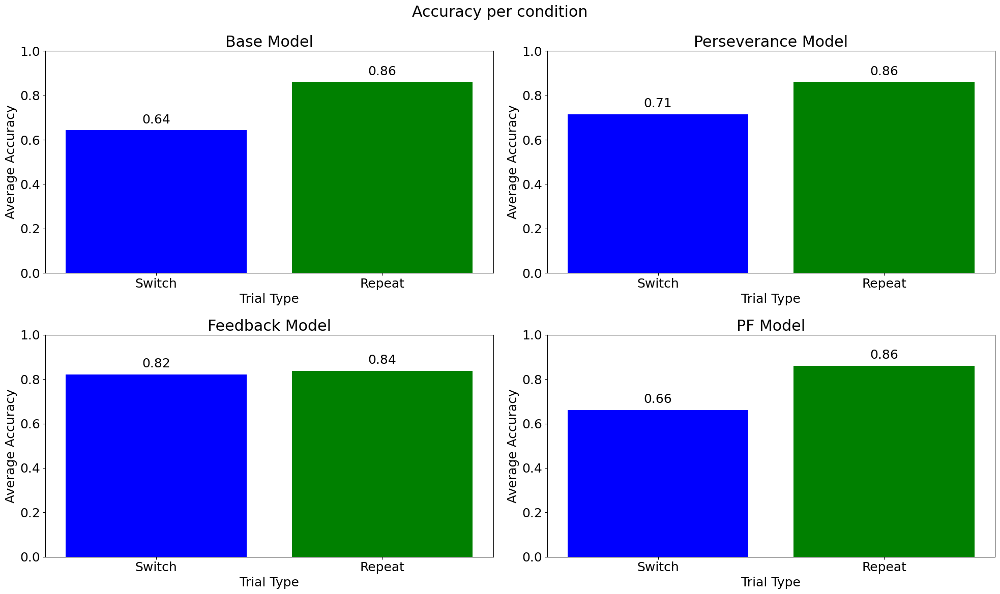

In [13]:
acc_per_condition_baase = calculate_accuracy_per_condition(data_Base)
acc_per_condition_perseverance = calculate_accuracy_per_condition(data_P)
print(acc_per_condition_baase, '(base model)')
print(acc_per_condition_perseverance, '(perseverance model)')

# Plotting the accuracy per condition of the base and perseverance model
fig, axs = plt.subplots(2, 2, figsize=(20, 12))
axs = axs.ravel()
fig.suptitle('Accuracy per condition')
plot_accuracy_per_condition(data_Base, ax=axs[0])
axs[0].set_title('Base Model')

plot_accuracy_per_condition(data_P, ax=axs[1])
axs[1].set_title('Perseverance Model')

plot_accuracy_per_condition(data_F, ax=axs[2])
axs[2].set_title('Feedback Model')

plot_accuracy_per_condition(data_PF, ax=axs[3])
axs[3].set_title('PF Model')

plt.tight_layout()
plt.show()

## Parameter Fitting *(4 points)*

For this exercise you should:

*   Set up a suitable parameter search space *(1 point)*

*   Implement a procedure to evaluate the fit of a model based on data *(2 points)*

*   Implement a procedure for searching the parameter space. *(1 point)*

Make sure to comment your code and provide an explanation for each code block in a preceding text block.



In [14]:
from parameter_fitting import param_fit_grid_search, param_fit_grid_search_parallel, plot_heatmap
from model_simulation import simulate_experiment
from analysis import calculate_accuracy_per_condition, plot_accuracy_per_condition

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

### Fitting the models to either surregate or participant data

In [15]:
# Parameter Fitting
seed = 40
np.random.seed(seed)
# search space over parameters T and g (sigma and c are assumed to be known)
num_samples = 2

min_g, max_g = 0, 5
min_c, max_c = -2, 2
min_alpha, max_alpha = -0.5, 0.5
min_gamma, max_gamma = -1, 1

# experiment parameters
num_trials = 100

# setting model parameters
# hyperparameters
T = 2
sigma = 0.2
tau_P = 1
x_0 = np.array([0.5, 0.5, 0])

# free parameters
true_g = 3
true_c = -0.5
true_alpha = 0.1
true_gamma = 0.4

g_values = np.linspace(min_g, max_g, num_samples)
c_values = np.linspace(min_c, max_c, num_samples)
alpha_values = np.linspace(min_alpha, max_alpha, num_samples)
gamma_values = np.linspace(min_gamma, max_gamma, num_samples)


experiment_trials = generate_experiment_trials(num_trials)
# obtain surrogate data by simulating the model with the set parameters
df_base = simulate_experiment(num_trials, T, x_0, true_g, true_c, 0, 0, sigma, tau_P, task_sequence = experiment_trials)
df_P = simulate_experiment(num_trials, T, x_0, true_g, true_c, 0, true_gamma, sigma, tau_P, task_sequence = experiment_trials)
df_F = simulate_experiment(num_trials, T, x_0, true_g, true_c, true_alpha, 0, sigma, tau_P, task_sequence = experiment_trials)
df_PF = simulate_experiment(num_trials, T, x_0, true_g, true_c, true_alpha, true_gamma, sigma, tau_P, task_sequence = experiment_trials)

Run the cell below to fit on a participant data instead of the surrogate data generated above.

In [16]:
# fit to participant
df_base = data_cleaned.copy()
df_P = data_cleaned.copy()
df_F = data_cleaned.copy()
df_PF = data_cleaned.copy()

run parameter fitting on all models

In [17]:
# base model
best_params_base, best_LL_base, LL_matrix_base = param_fit_grid_search_parallel(df_base, T, x_0, g_values, c_values, np.zeros(1), np.zeros(1), sigma, tau_P)
best_g_base, best_c_base, best_alpha_base, best_gamma_base = best_params_base

Parallel Grid Search:   0%|          | 0/4 [00:00<?, ?it/s]

In [18]:
# perseverence model
best_params_P, best_LL_P, LL_matrix_P = param_fit_grid_search_parallel(df_P, T, x_0, g_values, c_values, np.zeros(1), gamma_values, sigma, tau_P)
best_g_P, best_c_P, best_alpha_P, best_gamma_P = best_params_P

Parallel Grid Search:   0%|          | 0/8 [00:00<?, ?it/s]

In [19]:
best_params_F, best_LL_F, LL_matrix_F = param_fit_grid_search_parallel(df_F, T, x_0, g_values, c_values, alpha_values, np.zeros(1), sigma, tau_P)
best_g_F, best_c_F, best_alpha_F, best_gamma_F = best_params_F                          

Parallel Grid Search:   0%|          | 0/8 [00:00<?, ?it/s]

In [20]:
best_params_PF, best_LL_PF, LL_matrix_PF = param_fit_grid_search_parallel(df_PF, T, x_0, g_values, c_values, alpha_values, gamma_values, sigma, tau_P)
best_g_PF, best_c_PF, best_alpha_PF, best_gamma_PF = best_params_PF

Parallel Grid Search:   0%|          | 0/16 [00:00<?, ?it/s]

In [21]:
# print search space
print("g_values:", g_values)
print("c_values:", c_values)
print("alpha_values:", alpha_values)
print("gamma_values:", gamma_values)
print("true_g:", true_g)
print("true_c:", true_c)
print("true_alpha:", true_alpha)
print("true_gamma:", true_gamma)

g_values: [0. 5.]
c_values: [-2.  2.]
alpha_values: [-0.5  0.5]
gamma_values: [-1.  1.]
true_g: 3
true_c: -0.5
true_alpha: 0.1
true_gamma: 0.4


In [22]:
# make a df of the best fitted params and LL
model_names = ['base', 'perseverance', 'feedback', 'PF']
best_params_all = [best_params_base, best_params_P, best_params_F, best_params_PF]
best_LLs = [best_LL_base, best_LL_P, best_LL_F, best_LL_PF]

param_fitting_results = pd.DataFrame(columns=['best_g', 'best_c', 'best_alpha', 'best_gamma', 'best_LL'], index=model_names)

for model, bets_param, LL in zip(model_names, best_params_all, best_LLs):
    param_fitting_results.loc[model] = [*bets_param, LL]

param_fitting_results = param_fitting_results.astype(float).round(3)

display(param_fitting_results)

,best_g,best_c,best_alpha,best_gamma,best_LL
base,0.0,-2.0,0.0,0.0,-64.463
perseverance,0.0,-2.0,0.0,-1.0,-64.463
feedback,0.0,-2.0,-0.5,0.0,-64.463
PF,5.0,-2.0,-0.5,1.0,-64.343


best_g         0.000
best_c        -2.000
best_alpha     0.000
best_gamma     0.000
best_LL      -64.463
Name: base, dtype: float64

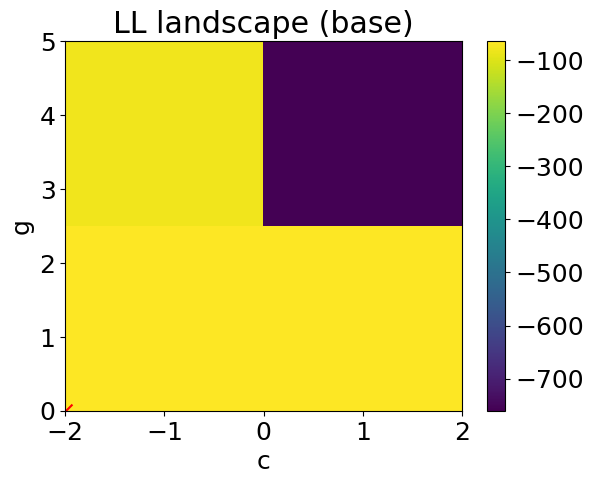

In [23]:
# base model
display(param_fitting_results.loc['base'])

ax = plot_heatmap(LL_matrix_base[:,:,0,0], c_values, g_values, 'c', 'g', f'LL landscape (base)')
ax.scatter(best_c_base, best_g_base, color='r', s=100 , marker='x')
plt.show()

In [24]:
# Fix indices for best parameters (for slicing the 4D LL_matrix_P)
g_idx_fixed = np.argmin(np.abs(g_values - best_g_PF))
c_idx_fixed = np.argmin(np.abs(c_values - best_c_PF))
alpha_idx_fixed = np.argmin(np.abs(alpha_values - best_alpha_PF))
gamma_idx_fixed = np.argmin(np.abs(gamma_values - best_gamma_PF))

best_g         0.000
best_c        -2.000
best_alpha     0.000
best_gamma    -1.000
best_LL      -64.463
Name: perseverance, dtype: float64

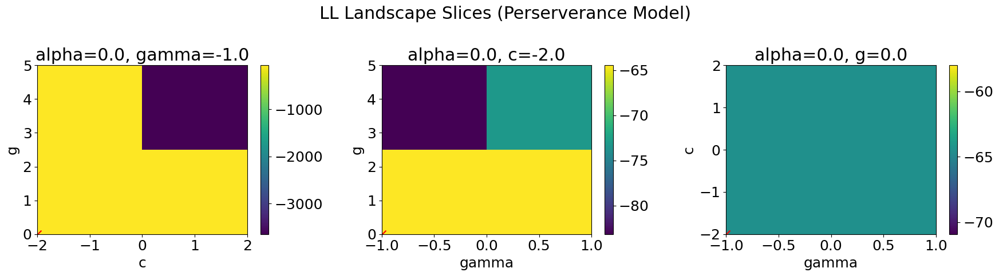

In [25]:
# perseverence model
display(param_fitting_results.loc['perseverance'])

fig, axs = plt.subplots(1, 3, figsize=(18, 5))
fig.subplots_adjust(hspace=0.5, wspace=0.5)
fig.suptitle('LL Landscape Slices (Perserverance Model)')
axs = axs.ravel()

# fix alpha gamma, vary g c
plot_heatmap(LL_matrix_P[:, :, 0, gamma_idx_fixed],
             c_values, g_values, 'c', 'g',
             title=f'alpha={np.round(best_alpha_P, 2)}, gamma={np.round(best_gamma_P, 2)}',
             ax=axs[0])
axs[0].scatter(best_c_P, best_g_P, color='red', s=100, marker='x')

# fix alpha c, vary g and gamma
plot_heatmap(LL_matrix_P[:, c_idx_fixed, 0, :],
             gamma_values, g_values, 'gamma', 'g',
             title=f'alpha={np.round(best_alpha_P, 2)}, c={np.round(best_c_P, 2)}',
             ax=axs[1])
axs[1].scatter(best_gamma_P, best_g_P, color='red', s=100, marker='x')

# fix g alpha, vary c and gamma
plot_heatmap(LL_matrix_P[c_idx_fixed, :, 0, :],
             gamma_values, c_values, 'gamma', 'c',
             title=f'alpha={np.round(best_alpha_P, 2)}, g={np.round(best_g_P, 2)}',
             ax=axs[2])
axs[2].scatter(best_gamma_P, best_c_P, color='red', s=100, marker='x')


plt.tight_layout()
plt.show()

best_g         0.000
best_c        -2.000
best_alpha    -0.500
best_gamma     0.000
best_LL      -64.463
Name: feedback, dtype: float64

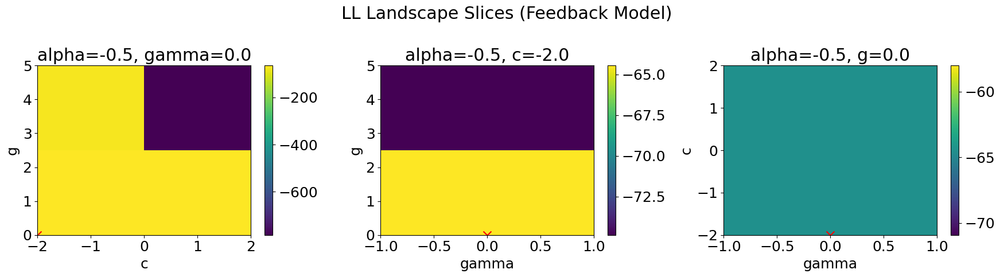

In [26]:
# feedback model
display(param_fitting_results.loc['feedback'])

fig, axs = plt.subplots(1, 3, figsize=(18, 5))
fig.subplots_adjust(hspace=0.5, wspace=0.5)
fig.suptitle('LL Landscape Slices (Feedback Model)')
axs = axs.ravel()

# fix alpha gamma, vary g c
plot_heatmap(LL_matrix_F[:, :, alpha_idx_fixed, 0],
             c_values, g_values, 'c', 'g',
             title=f'alpha={np.round(best_alpha_F, 2)}, gamma={np.round(best_gamma_F, 2)}',
             ax=axs[0])
axs[0].scatter(best_c_F, best_g_F, color='red', s=100, marker='x')

# fix alpha c, vary g and gamma
plot_heatmap(LL_matrix_F[:, c_idx_fixed, alpha_idx_fixed, :],
             gamma_values, g_values, 'gamma', 'g',
             title=f'alpha={np.round(best_alpha_F, 2)}, c={np.round(best_c_F, 2)}',
             ax=axs[1])
axs[1].scatter(best_gamma_F, best_g_F, color='red', s=100, marker='x')

# fix g alpha, vary c and gamma
plot_heatmap(LL_matrix_F[c_idx_fixed, :, alpha_idx_fixed, :],
             gamma_values, c_values, 'gamma', 'c',
             title=f'alpha={np.round(best_alpha_F, 2)}, g={np.round(best_g_F, 2)}',
             ax=axs[2])
axs[2].scatter(best_gamma_F, best_c_F, color='red', s=100, marker='x')

plt.tight_layout()
plt.show()

best_g         5.000
best_c        -2.000
best_alpha    -0.500
best_gamma     1.000
best_LL      -64.343
Name: PF, dtype: float64

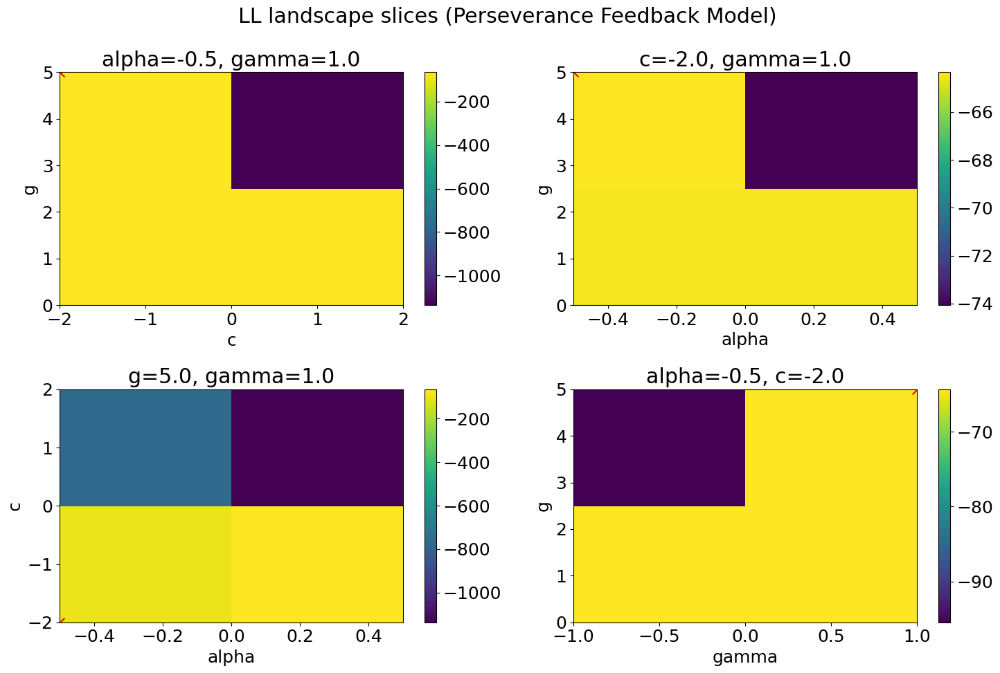

In [27]:
# PF model
display(param_fitting_results.loc['PF'])

fig, axs = plt.subplots(2, 2, figsize=(15, 10))
fig.subplots_adjust(hspace=0.5, wspace=0.5)
fig.suptitle('LL landscape slices (Perseverance Feedback Model)')
axs = axs.ravel()

# fix alpha gamma, vary c g
plot_heatmap(LL_matrix_PF[:, :, alpha_idx_fixed, gamma_idx_fixed], 
             c_values, g_values, 'c', 'g', 
             title=f'alpha={np.round(best_alpha_PF, 2)}, gamma={np.round(best_gamma_PF, 2)}',
             ax=axs[0])
axs[0].scatter(best_c_PF, best_g_PF, color='red', s=100, marker='x')

# fix c gamma, vary g alpha
plot_heatmap(LL_matrix_PF[:, c_idx_fixed, :, gamma_idx_fixed], 
             alpha_values, g_values, 'alpha', 'g', 
             title=f'c={np.round(best_c_PF, 2)}, gamma={np.round(best_gamma_PF, 2)}',
             ax=axs[1])
axs[1].scatter(best_alpha_PF, best_g_PF, color='red', s=100, marker='x')

# fix g gamma, vary c, alpha
plot_heatmap(LL_matrix_PF[g_idx_fixed, :, alpha_idx_fixed, :], 
             alpha_values, c_values, 'alpha', 'c', 
             title=f'g={np.round(best_g_PF, 2)}, gamma={np.round(best_gamma_PF, 2)}',
             ax=axs[2])
axs[2].scatter(best_alpha_PF, best_c_PF, color='red', s=100, marker='x')

# fix c alpha, vary g, gamma
plot_heatmap(LL_matrix_PF[:, c_idx_fixed, alpha_idx_fixed, :], 
             gamma_values, g_values, 'gamma', 'g', 
             title=f'alpha={np.round(best_alpha_PF, 2)}, c={np.round(best_c_PF, 2)}',
             ax=axs[3])
axs[3].scatter(best_gamma_PF, best_g_PF, color='red', s=100, marker='x')

plt.tight_layout()
plt.show()

#### brief inspection of the fitted models, as a sanity check

Base Model parameters: g=0.0, c=-2.0, alpha=0.0, gamma=0.0, LL=-64.46268779207496
Ploting first 20 trials:


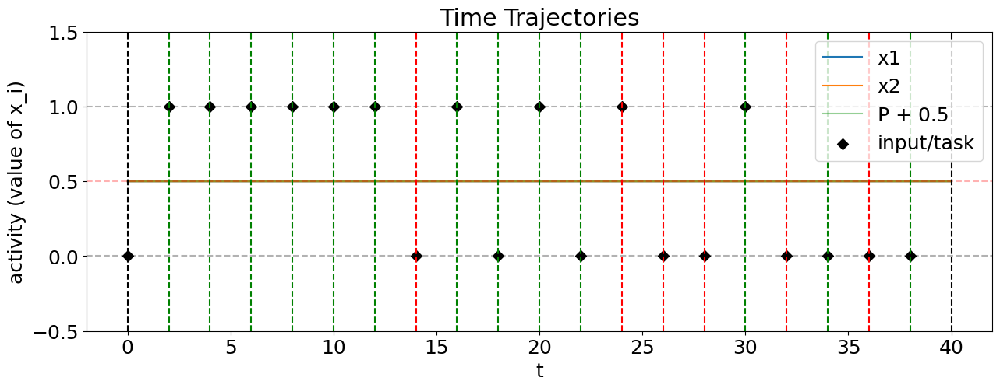

Perseverence Model parameters: g=0.0, c=-2.0, alpha=0.0, gamma=-1.0, LL=-64.46268779207496
Ploting first 20 trials:


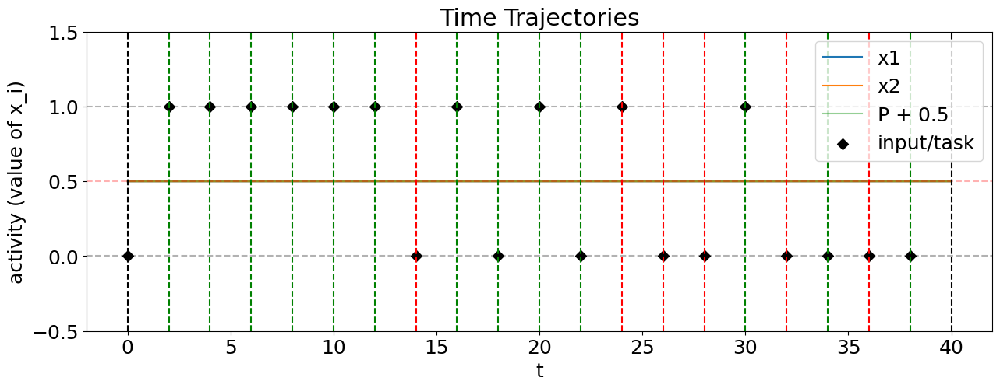

Perseverance Feedback Model parameters: g=5.0, c=-2.0, alpha=-0.5, gamma=1.0, LL=-64.34250804701696
Ploting first 20 trials:


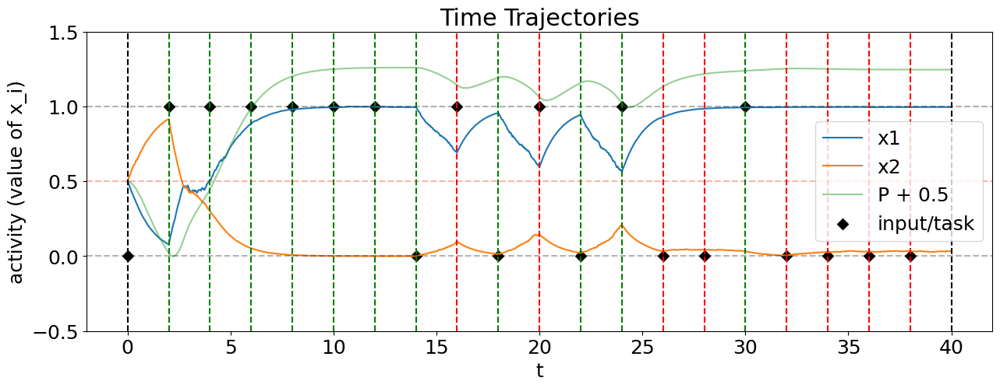

<Figure size 640x480 with 0 Axes>

In [28]:
# simulating a small sample of trials to get an insight into the dynamics of fitted models
seed = 40

experiment_trials = generate_experiment_trials(num_trials)
# Base Model
np.random.seed(seed)
print(f"Base Model parameters: g={best_g_base}, c={best_c_base}, alpha={best_alpha_base}, gamma={best_gamma_base}, LL={best_LL_base}")
data_Base = simulate_experiment(num_trials, T, x_0, best_g_base, best_c_base, best_alpha_base, best_gamma_base, sigma, tau_P, bool_plot_trajectory = True, task_sequence = experiment_trials)

# Perseverence Model
np.random.seed(seed)
print(f"Perseverence Model parameters: g={best_g_P}, c={best_c_P}, alpha={best_alpha_P}, gamma={best_gamma_P}, LL={best_LL_P}")
data_P = simulate_experiment(num_trials, T, x_0, best_g_P, best_c_P, best_alpha_P, best_gamma_P, sigma, tau_P, bool_plot_trajectory = True, task_sequence = experiment_trials)

# Perseverance Feedback Model
np.random.seed(seed)
print(f"Perseverance Feedback Model parameters: g={best_g_PF}, c={best_c_PF}, alpha={best_alpha_PF}, gamma={best_gamma_PF}, LL={best_LL_PF}")
data_PF = simulate_experiment(num_trials, T, x_0, best_g_PF, best_c_PF, best_alpha_PF, best_gamma_PF, sigma, tau_P, bool_plot_trajectory = True, task_sequence = experiment_trials)

accuracy base:  0.5050505050505051
accuracy perserverance:  0.5050505050505051
accuracy participant:  0.8924731182795699
accuracy perserverance feedback:  0.5151515151515151
{'average_accuracy_switch': 0.46153846153846156, 'average_accuracy_repeat': 0.5333333333333333}  (base)
{'average_accuracy_switch': 0.46153846153846156, 'average_accuracy_repeat': 0.5333333333333333}  (P)
{'average_accuracy_switch': 0.8780487804878049, 'average_accuracy_repeat': 0.9038461538461539}  (participant)
{'average_accuracy_switch': 0.5128205128205128, 'average_accuracy_repeat': 0.5166666666666667}  (PF)


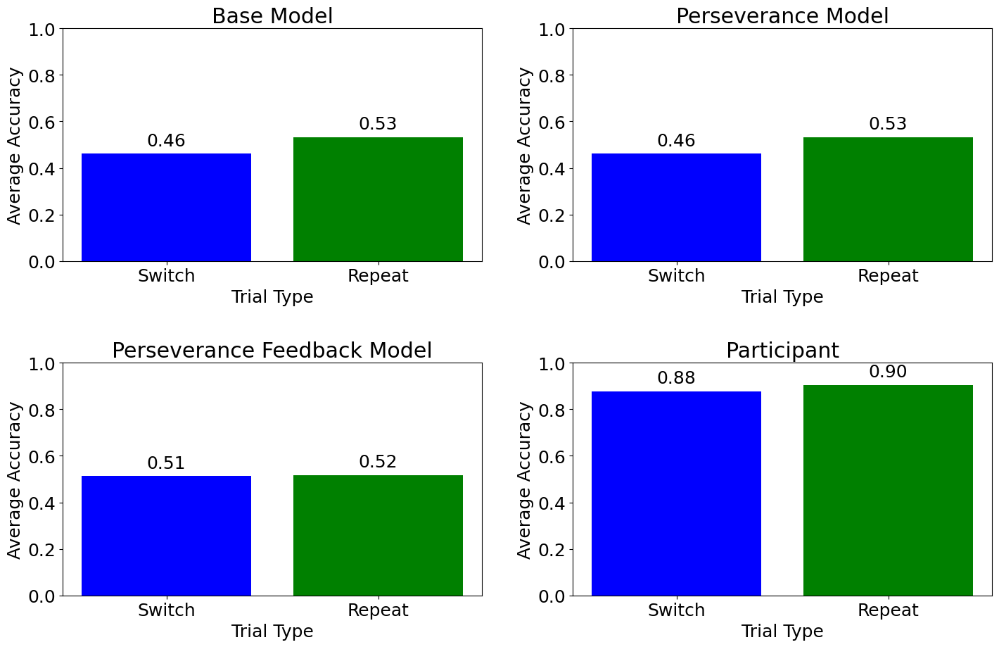

In [29]:
# plot accuary over trails for both models
print('accuracy base: ', data_Base.iloc[-1]['accuracy'])
print('accuracy perserverance: ', data_P.iloc[-1]['accuracy'])
print('accuracy participant: ', data_cleaned.iloc[-1]['accuracy'])
print('accuracy perserverance feedback: ', data_PF.iloc[-1]['accuracy'])

compare_base = calculate_accuracy_per_condition(data_Base)
compare_P = calculate_accuracy_per_condition(data_P)
compare_participant = calculate_accuracy_per_condition(data_cleaned)
compare_PF = calculate_accuracy_per_condition(data_PF)

print(compare_base, ' (base)')
print(compare_P, ' (P)')
print(compare_participant, ' (participant)')
print(compare_PF, ' (PF)')

# plot accuracy per condition
fig, axs = plt.subplots(2, 2, figsize=(15, 10))
axs = axs.ravel()

plot_accuracy_per_condition(data_Base, ax=axs[0])
axs[0].set_title('Base Model')

plot_accuracy_per_condition(data_P, ax=axs[1])
axs[1].set_title('Perseverance Model')

plot_accuracy_per_condition(data_PF, ax=axs[2])
axs[2].set_title('Perseverance Feedback Model')

plot_accuracy_per_condition(data_cleaned, ax=axs[3])
axs[3].set_title('Participant')

plt.tight_layout(pad=2.0)   
plt.show()

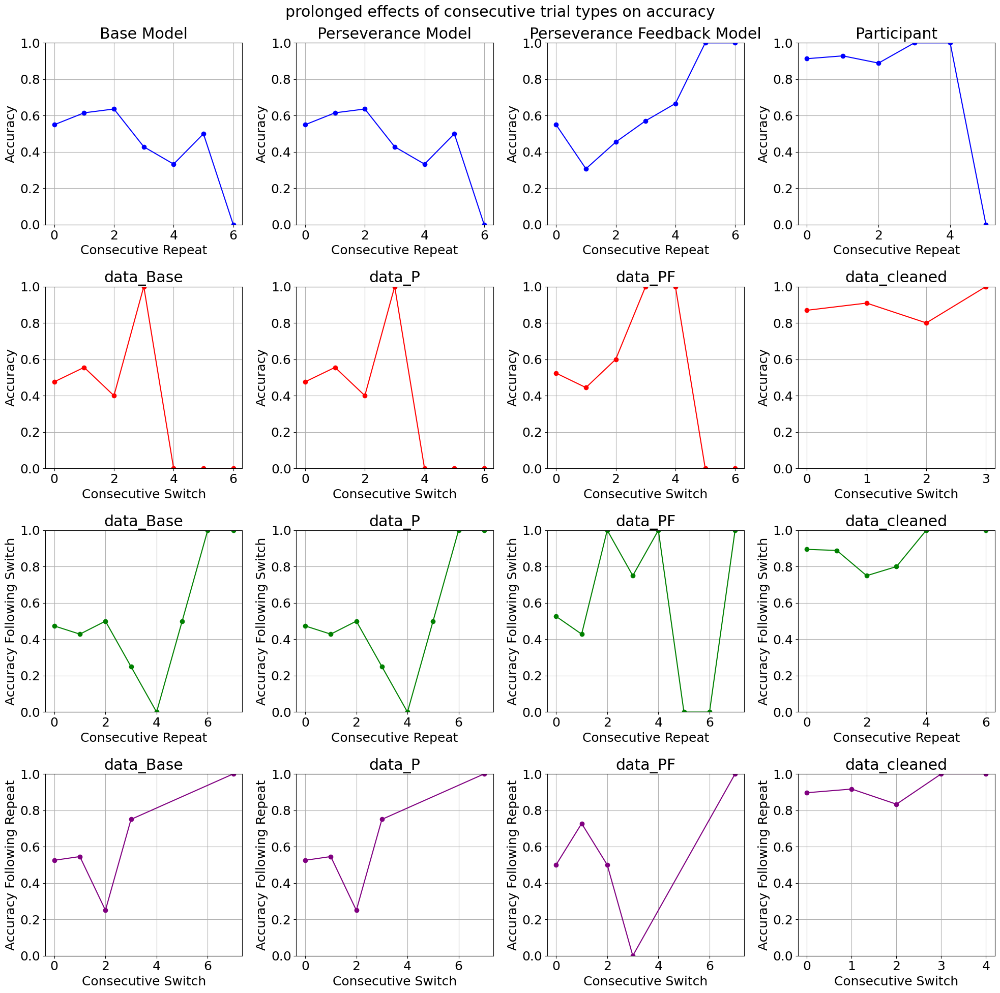

In [30]:
from analysis import analyze_accuracy_by_previous_repeats, analyze_accuracy_by_previous_switches, analyze_switch_accuracy_after_repeats, analyze_repeat_accuracy_after_switches

# plot in one figuire
fig, axs = plt.subplots(4, 4, figsize=(20, 20))
axs = axs.ravel()
fig.suptitle('prolonged effects of consecutive trial types on accuracy')

analyze_accuracy_by_previous_repeats(data_Base, "data_Base", ax=axs[0])
analyze_accuracy_by_previous_repeats(data_P, "data_P", ax=axs[1])
analyze_accuracy_by_previous_repeats(data_PF, "data_PF", ax=axs[2])
analyze_accuracy_by_previous_repeats(data_cleaned, "data_cleaned", ax=axs[3])

analyze_accuracy_by_previous_switches(data_Base, "data_Base", ax=axs[4])
analyze_accuracy_by_previous_switches(data_P, "data_P", ax=axs[5])
analyze_accuracy_by_previous_switches(data_PF, "data_PF", ax=axs[6])
analyze_accuracy_by_previous_switches(data_cleaned, "data_cleaned", ax=axs[7])

analyze_switch_accuracy_after_repeats(data_Base, "data_Base", ax=axs[8])
analyze_switch_accuracy_after_repeats(data_P, "data_P", ax=axs[9])
analyze_switch_accuracy_after_repeats(data_PF, "data_PF", ax=axs[10])
analyze_switch_accuracy_after_repeats(data_cleaned, "data_cleaned", ax=axs[11])

analyze_repeat_accuracy_after_switches(data_Base, "data_Base", ax=axs[12])
analyze_repeat_accuracy_after_switches(data_P, "data_P", ax=axs[13])
analyze_repeat_accuracy_after_switches(data_PF, "data_PF", ax=axs[14])
analyze_repeat_accuracy_after_switches(data_cleaned, "data_cleaned", ax=axs[15])

# set a title of the 4 plots in each column (Base, Perseverance, Perseverance Feedback, Participant)
axs[0].set_title('Base Model')
axs[1].set_title('Perseverance Model')
axs[2].set_title('Perseverance Feedback Model')
axs[3].set_title('Participant')

plt.tight_layout()
plt.show()

## Parameter Recovery *(5 points)*

For this exercise you should:

*   Set up a suitable space of parameters relevant for parameter recovery *(1 point)*

*   Use the functions above to generate behavior from a models, for a given set of (randomly sampled) parameters, and then fit the model to its generated data. Make sure to evaluate the parameter fit in a quantiative manner. *(3 points)*

*   Plot the parameter recovery results for both models. *(1 point)*

Make sure to comment your code and provide an explanation for each code block in a preceding text block.





In [31]:
from parameter_recovery import param_recovery, summarize_paramRecovery_results, plot_true_fitted_correlation, plot_cross_correlation

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

In [32]:
# Parameter Recovery
np.random.seed(1)
# Number of true values we seek to simulate and num of search values for fitting
num_true_param_set = 5
num_samples = 2

# Experiment parameters
num_trials = 100
T = 2
sigma = 0.2
tau_P = 1
x_0 = np.array([0.5, 0.5, 0])

# Range of simulated and tested values for c, g, alpha, gamma
min_g, max_g = 0, 5
min_c, max_c = -2, 2
min_alpha, max_alpha = -0.5, 0.5
min_gamma, max_gamma = -1, 1

# Determine range of parameters for fitting
g_values = np.linspace(min_g, max_g, num_samples)
c_values = np.linspace(min_c, max_c, num_samples)
alpha_values = np.linspace(min_alpha, max_alpha, num_samples)
gamma_values = np.linspace(min_gamma, max_gamma, num_samples)

# param sets/combinations to recover
to_recover_g = np.random.uniform(min_g, max_g, num_true_param_set)
to_recover_c = np.random.uniform(min_c, max_c, num_true_param_set)
to_recover_alpha = np.random.uniform(min_alpha, max_alpha, num_true_param_set)
to_recover_gamma = np.random.uniform(min_gamma, max_gamma, num_true_param_set)

In [33]:
# base model
fitted_g_log_base, fitted_c_log_base, fitted_alpha_log_base, fitted_gamma_log_base, LL_log_base = param_recovery(num_trials, T, x_0,
                                                                        to_recover_g, to_recover_c, np.zeros(num_true_param_set), np.zeros(num_true_param_set),
                                                                        g_values, c_values, np.zeros(1), np.zeros(1), sigma, tau_P)

run:   0%|          | 0/5 [00:00<?, ?it/s]

Parallel Grid Search:   0%|          | 0/4 [00:00<?, ?it/s]

Parallel Grid Search:   0%|          | 0/4 [00:00<?, ?it/s]

Parallel Grid Search:   0%|          | 0/4 [00:00<?, ?it/s]

Parallel Grid Search:   0%|          | 0/4 [00:00<?, ?it/s]

Parallel Grid Search:   0%|          | 0/4 [00:00<?, ?it/s]

In [34]:
# perseverence model
fitted_g_log_P, fitted_c_log_P, fitted_alpha_log_P, fitted_gamma_log_P, LL_log_P = param_recovery(num_trials, T, x_0,
                                                                        to_recover_g, to_recover_c, np.zeros(num_true_param_set), to_recover_gamma,
                                                                        g_values, c_values, np.zeros(1), gamma_values, sigma, tau_P)

run:   0%|          | 0/5 [00:00<?, ?it/s]

Parallel Grid Search:   0%|          | 0/8 [00:00<?, ?it/s]

Parallel Grid Search:   0%|          | 0/8 [00:00<?, ?it/s]

Parallel Grid Search:   0%|          | 0/8 [00:00<?, ?it/s]

Parallel Grid Search:   0%|          | 0/8 [00:00<?, ?it/s]

Parallel Grid Search:   0%|          | 0/8 [00:00<?, ?it/s]

In [35]:
# feedback model
fitted_g_log_F, fitted_c_log_F, fitted_alpha_log_F, fitted_gamma_log_F, LL_log_F = param_recovery(num_trials, T, x_0,
                                                                        to_recover_g, to_recover_c, to_recover_alpha, np.zeros(num_true_param_set),
                                                                        g_values, c_values, alpha_values, np.zeros(1), sigma, tau_P)

run:   0%|          | 0/5 [00:00<?, ?it/s]

Parallel Grid Search:   0%|          | 0/8 [00:00<?, ?it/s]

Parallel Grid Search:   0%|          | 0/8 [00:00<?, ?it/s]

Parallel Grid Search:   0%|          | 0/8 [00:00<?, ?it/s]

Parallel Grid Search:   0%|          | 0/8 [00:00<?, ?it/s]

Parallel Grid Search:   0%|          | 0/8 [00:00<?, ?it/s]

In [36]:
# PF model
fitted_g_log_PF, fitted_c_log_PF, fitted_alpha_log_PF, fitted_gamma_log_PF, LL_log_PF = param_recovery(num_trials, T, x_0,
                                                                        to_recover_g, to_recover_c, to_recover_alpha, to_recover_gamma,
                                                                        g_values, c_values, alpha_values, gamma_values, sigma, tau_P)

run:   0%|          | 0/5 [00:00<?, ?it/s]

Parallel Grid Search:   0%|          | 0/16 [00:00<?, ?it/s]

Parallel Grid Search:   0%|          | 0/16 [00:00<?, ?it/s]

Parallel Grid Search:   0%|          | 0/16 [00:00<?, ?it/s]

Parallel Grid Search:   0%|          | 0/16 [00:00<?, ?it/s]

Parallel Grid Search:   0%|          | 0/16 [00:00<?, ?it/s]

In [37]:
param_names = ['g', 'c', 'alpha', 'gamma']

# summarize the results
# base
results_base, inter_corr_base, cross_corr_base = summarize_paramRecovery_results(param_names, to_recover_g, to_recover_c, np.zeros(num_true_param_set), np.zeros(num_true_param_set),
                                                                                    fitted_g_log_base, fitted_c_log_base, fitted_alpha_log_base, fitted_gamma_log_base, LL_log_base)
# perseverence
results_P, inter_corr_P, cross_corr_P = summarize_paramRecovery_results(param_names, to_recover_g, to_recover_c, np.zeros(num_true_param_set), to_recover_gamma,
                                                                                    fitted_g_log_P, fitted_c_log_P, fitted_alpha_log_P, fitted_gamma_log_P, LL_log_P)
# feedback
results_F, inter_corr_F, cross_corr_F = summarize_paramRecovery_results(param_names, to_recover_g, to_recover_c, to_recover_alpha, np.zeros(num_true_param_set),
                                                                                    fitted_g_log_F, fitted_c_log_F, fitted_alpha_log_F, fitted_gamma_log_F, LL_log_F)
# PF
results_PF, inter_corr_PF, cross_corr_PF = summarize_paramRecovery_results(param_names, to_recover_g, to_recover_c, to_recover_alpha, to_recover_gamma,
                                                                                    fitted_g_log_PF, fitted_c_log_PF, fitted_alpha_log_PF, fitted_gamma_log_PF, LL_log_PF)
          
# print the results
print('Base Model:')
display(results_base)
display(inter_corr_base)
display(cross_corr_base)
print('-'*50)
print('Perseverance Model:')
display(results_P)
display(inter_corr_P)
display(cross_corr_P)
print('-'*50)
print('Feedback Model:')
display(results_F)
display(inter_corr_F)
display(cross_corr_F)
print('-'*50)
print('Perseverance Feedback Model:')
display(results_PF)
display(inter_corr_PF)
display(cross_corr_PF)

Base Model:


/home/mj/Documents/Esma/MiCNS/DynamicalSystemsModelling_TS/parameter_recovery.py:101: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  corr_true_fitted = [pearsonr(results_df[f"true_{param}"], results_df[f"fitted_{param}"]) for param in param_names]
/home/mj/Documents/Esma/MiCNS/DynamicalSystemsModelling_TS/parameter_recovery.py:111: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  method=lambda x, y: pearsonr(x, y)[0]
/home/mj/Documents/Esma/MiCNS/DynamicalSystemsModelling_TS/parameter_recovery.py:101: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  corr_true_fitted = [pearsonr(results_df[f"true_{param}"], results_df[f"fitted_{param}"]) for param in param_names]
/home/mj/Documents/Esma/MiCNS/DynamicalSystemsModelling_TS/parameter_recovery.py:111: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  meth

,true_g,true_c,true_alpha,true_gamma,fitted_g,fitted_c,fitted_alpha,fitted_gamma,LL
0,2.085110,-1.630646,0.0,0.0,0.0,-2.0,0.0,0.0,-68.621571
1,3.601622,-1.254959,0.0,0.0,5.0,-2.0,0.0,0.0,-58.964059
2,0.000572,-0.617757,0.0,0.0,0.0,-2.0,0.0,0.0,-68.621571
3,1.511663,-0.412930,0.0,0.0,5.0,-2.0,0.0,0.0,-68.181851
4,0.733779,0.155267,0.0,0.0,0.0,-2.0,0.0,0.0,-68.621571


,correlation,p-value
parameter,,
g,0.644,2.41e-01
c,NaN,nan
alpha,NaN,nan
gamma,NaN,nan


,fitted_g,fitted_c,fitted_alpha,fitted_gamma
fitted_g,1.0,NaN,NaN,NaN
fitted_c,NaN,1.0,NaN,NaN
fitted_alpha,NaN,NaN,1.0,NaN
fitted_gamma,NaN,NaN,NaN,1.0


--------------------------------------------------
Perseverance Model:


,true_g,true_c,true_alpha,true_gamma,fitted_g,fitted_c,fitted_alpha,fitted_gamma,LL
0,2.085110,-1.630646,0.0,0.340935,0.0,-2.0,0.0,-1.0,-68.621571
1,3.601622,-1.254959,0.0,-0.165390,5.0,-2.0,0.0,-1.0,-63.940841
2,0.000572,-0.617757,0.0,0.117380,0.0,-2.0,0.0,-1.0,-68.621571
3,1.511663,-0.412930,0.0,-0.719226,0.0,-2.0,0.0,-1.0,-68.621571
4,0.733779,0.155267,0.0,-0.603797,0.0,-2.0,0.0,-1.0,-68.621571


,correlation,p-value
parameter,,
g,0.82,8.95e-02
c,NaN,nan
alpha,NaN,nan
gamma,NaN,nan


,fitted_g,fitted_c,fitted_alpha,fitted_gamma
fitted_g,1.0,NaN,NaN,NaN
fitted_c,NaN,1.0,NaN,NaN
fitted_alpha,NaN,NaN,1.0,NaN
fitted_gamma,NaN,NaN,NaN,1.0


--------------------------------------------------
Feedback Model:


,true_g,true_c,true_alpha,true_gamma,fitted_g,fitted_c,fitted_alpha,fitted_gamma,LL
0,2.085110,-1.630646,-0.080805,0.0,5.0,-2.0,-0.5,0.0,-66.703595
1,3.601622,-1.254959,0.185220,0.0,5.0,-2.0,-0.5,0.0,-67.043074
2,0.000572,-0.617757,-0.295548,0.0,0.0,-2.0,-0.5,0.0,-68.621571
3,1.511663,-0.412930,0.378117,0.0,0.0,-2.0,-0.5,0.0,-68.621571
4,0.733779,0.155267,-0.472612,0.0,0.0,-2.0,-0.5,0.0,-68.621571


,correlation,p-value
parameter,,
g,0.835,7.86e-02
c,NaN,nan
alpha,NaN,nan
gamma,NaN,nan


,fitted_g,fitted_c,fitted_alpha,fitted_gamma
fitted_g,1.0,NaN,NaN,NaN
fitted_c,NaN,1.0,NaN,NaN
fitted_alpha,NaN,NaN,1.0,NaN
fitted_gamma,NaN,NaN,NaN,1.0


--------------------------------------------------
Perseverance Feedback Model:


,true_g,true_c,true_alpha,true_gamma,fitted_g,fitted_c,fitted_alpha,fitted_gamma,LL
0,2.085110,-1.630646,-0.080805,0.340935,5.0,-2.0,-0.5,1.0,-63.604302
1,3.601622,-1.254959,0.185220,-0.165390,5.0,-2.0,0.5,-1.0,-57.337930
2,0.000572,-0.617757,-0.295548,0.117380,0.0,-2.0,-0.5,-1.0,-68.621571
3,1.511663,-0.412930,0.378117,-0.719226,5.0,-2.0,0.5,-1.0,-65.422935
4,0.733779,0.155267,-0.472612,-0.603797,5.0,-2.0,0.5,-1.0,-63.886892


,correlation,p-value
parameter,,
g,0.645,2.40e-01
c,NaN,nan
alpha,0.346,5.68e-01
gamma,0.672,2.14e-01


,fitted_g,fitted_c,fitted_alpha,fitted_gamma
fitted_g,1.000000,NaN,0.612372,0.250000
fitted_c,NaN,1.0,NaN,NaN
fitted_alpha,0.612372,NaN,1.000000,-0.612372
fitted_gamma,0.250000,NaN,-0.612372,1.000000


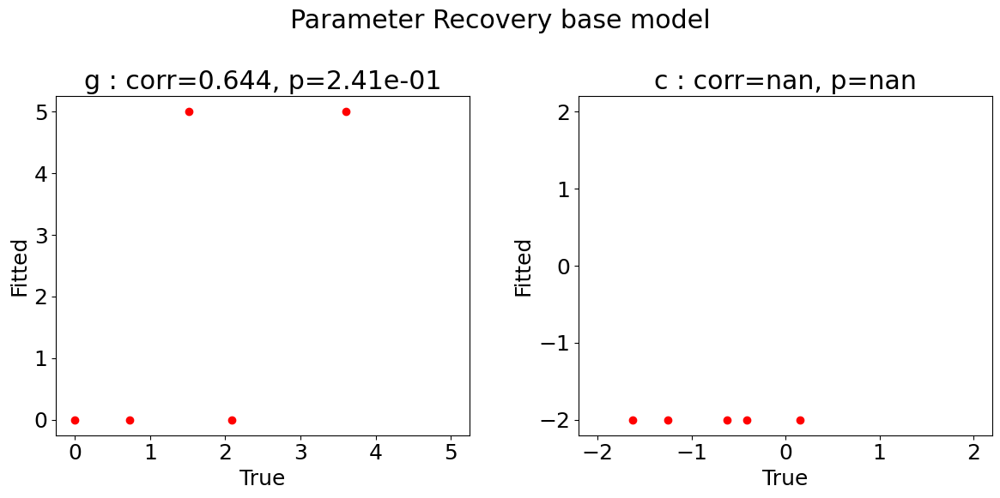

In [38]:
# plot the true to fitted parameters correlation for base model
fig, axs = plt.subplots(1, 2, figsize=(12, 6))  # Adjust the figsize as needed
axs = axs.ravel()
fig.suptitle('Parameter Recovery base model')

# set some margine to better see edge points
margin = 0.05

plot_true_fitted_correlation(to_recover_g, fitted_g_log_base, g_values, margin, axs[0])
axs[0].set_title(f'g : corr={inter_corr_base.loc["g", "correlation"]}, p={inter_corr_base.loc["g", "p-value"]}')

plot_true_fitted_correlation(to_recover_c, fitted_c_log_base, c_values, margin, axs[1])
axs[1].set_title(f'c : corr={inter_corr_base.loc["c", "correlation"]}, p={inter_corr_base.loc["c", "p-value"]}')

plt.tight_layout()
plt.show()

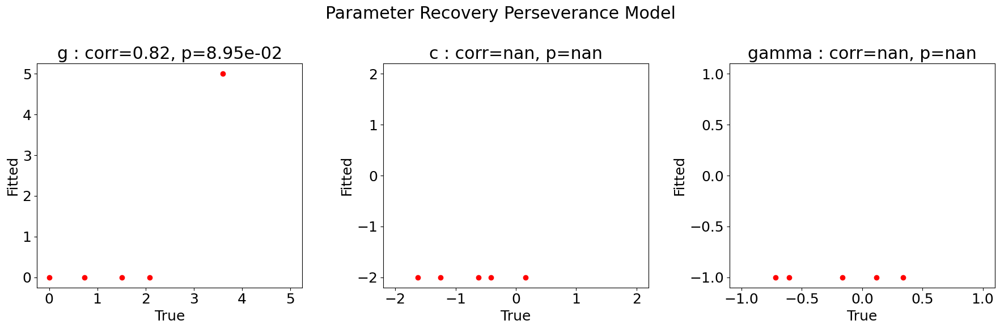

In [39]:
# plot the true to fitted parameters correlation for perseverence model
fig, axs = plt.subplots(1, 3, figsize=(18, 6))  # Adjust the figsize as needed
axs = axs.ravel()
fig.suptitle('Parameter Recovery Perseverance Model')

# set some margine to better see edge points
margin = 0.05

plot_true_fitted_correlation(to_recover_g, fitted_g_log_P, g_values, margin, axs[0])
axs[0].set_title(f'g : corr={inter_corr_P.loc["g", "correlation"]}, p={inter_corr_P.loc["g", "p-value"]}')

plot_true_fitted_correlation(to_recover_c, fitted_c_log_P, c_values, margin, axs[1])
axs[1].set_title(f'c : corr={inter_corr_P.loc["c", "correlation"]}, p={inter_corr_P.loc["c", "p-value"]}')

plot_true_fitted_correlation(to_recover_gamma, fitted_gamma_log_P, gamma_values, margin, axs[2])
axs[2].set_title(f'gamma : corr={inter_corr_P.loc["gamma", "correlation"]}, p={inter_corr_P.loc["gamma", "p-value"]}')

plt.tight_layout()
plt.show()

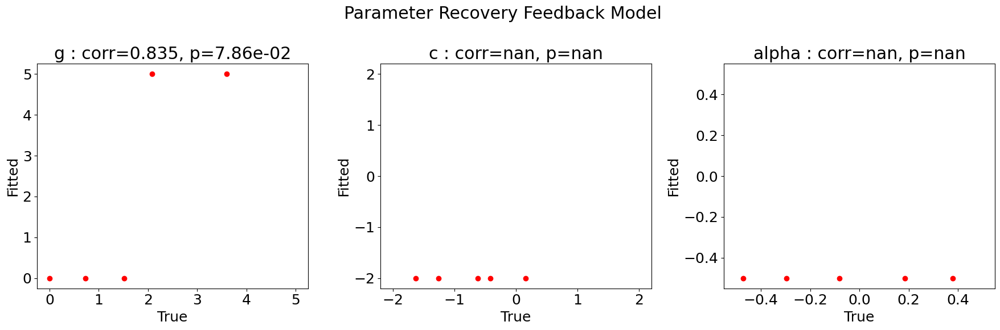

In [40]:
# plot the true to fitted parameters correlation for feedback model
fig, axs = plt.subplots(1, 3, figsize=(18, 6))  # Adjust the figsize as needed
axs = axs.ravel()
fig.suptitle('Parameter Recovery Feedback Model')

# set some margine to better see edge points
margin = 0.05

plot_true_fitted_correlation(to_recover_g, fitted_g_log_F, g_values, margin, axs[0])
axs[0].set_title(f'g : corr={inter_corr_F.loc["g", "correlation"]}, p={inter_corr_F.loc["g", "p-value"]}')

plot_true_fitted_correlation(to_recover_c, fitted_c_log_F, c_values, margin, axs[1])
axs[1].set_title(f'c : corr={inter_corr_F.loc["c", "correlation"]}, p={inter_corr_F.loc["c", "p-value"]}')

plot_true_fitted_correlation(to_recover_alpha, fitted_alpha_log_F, alpha_values, margin, axs[2])
axs[2].set_title(f'alpha : corr={inter_corr_F.loc["alpha", "correlation"]}, p={inter_corr_F.loc["alpha", "p-value"]}')


plt.tight_layout()
plt.show()

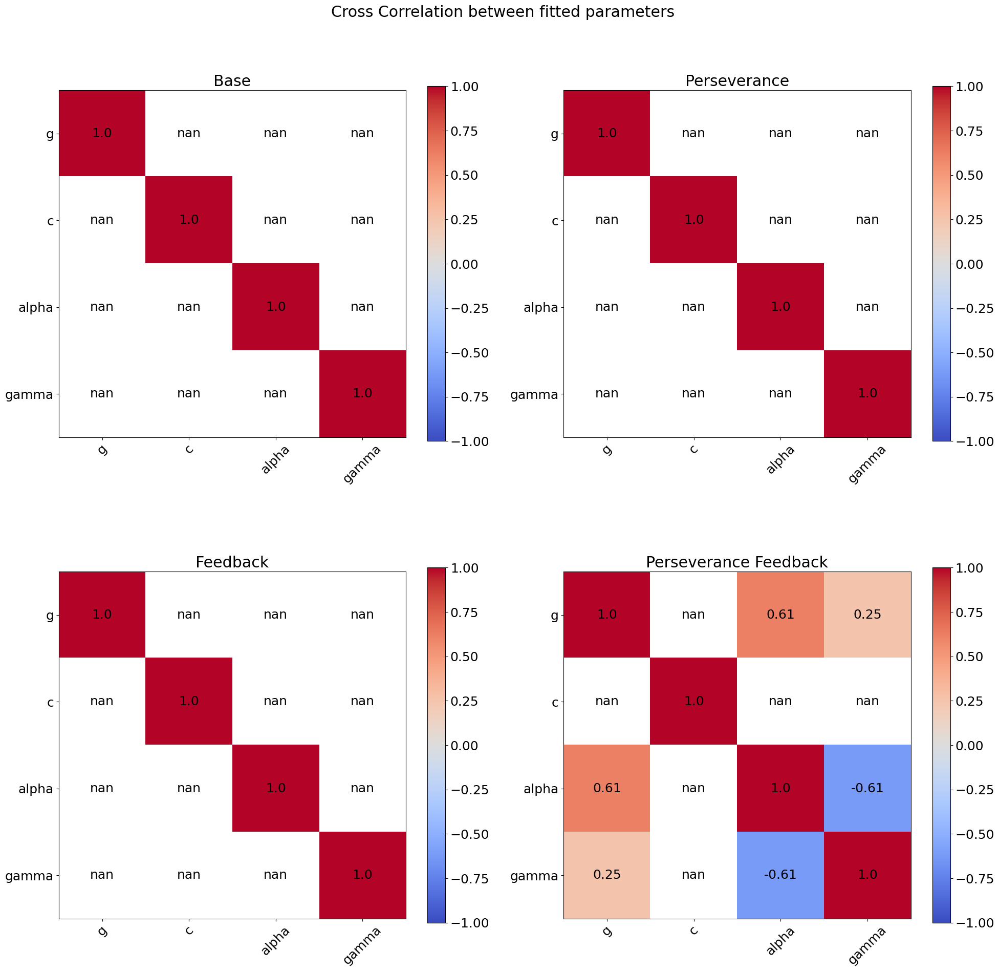

In [41]:
# plot cross correlation between the fitted parameters for both models
fig, axs = plt.subplots(2, 2, figsize=(20, 20))  # Adjust the figsize as needed
axs = axs.ravel()
fig.suptitle('Cross Correlation between fitted parameters')

# base model
plot_cross_correlation(cross_corr_base, param_names, ax=axs[0])
axs[0].set_title('Base')

# perseverence model
plot_cross_correlation(cross_corr_P, param_names, ax=axs[1])
axs[1].set_title('Perseverance')

# feedback model
plot_cross_correlation(cross_corr_F, param_names, ax=axs[2])
axs[2].set_title('Feedback')

# perseverence feedback model
plot_cross_correlation(cross_corr_PF, param_names, ax=axs[3])
axs[3].set_title('Perseverance Feedback')

plt.tight_layout()
plt.show()

## *Optional*: Model Recovery *(2 bonus points)*

In this bonus exercise, you may examine model reovery. The bonus points count towards your total group project points. That is, you may accumlate up to 22 points in the practical part of the group project.

Make sure to comment your code and provide an explanation for each code block in a preceding text block.





In [ ]:
from model_recovery import model_recovery, plot_model_recovery

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

In [6]:
# Parameter Recovery
np.random.seed(1)
# pick which models to include for the model recovery
# the models are indexed as follows: 0=base, 1=perseverance, 2=feedback, 3=PF
model_names = ['base', 'perseverance', 'feedback', 'PF']
num_models = len(model_names)
# Experiment parameters
num_trials = 100
T = 2
sigma = 0.2
tau_P = 1
x_0 = np.array([0.5, 0.5, 0])

# Number of true values we seek to simulate and num of search values
num_runs = 2
num_samples = 2

num_true_parameters_samples = num_runs * num_models

# Range of simulated and tested values for c, g, alpha, gamma
min_g, max_g = 0, 5
min_c, max_c = -2, 2
min_alpha, max_alpha = -0.5, 0.5
min_gamma, max_gamma = -1, 1

# Determine range of parameters for fitting
g_values = np.linspace(min_g, max_g, num_samples)
c_values = np.linspace(min_c, max_c, num_samples)
alpha_values = np.linspace(min_alpha, max_alpha, num_samples)
gamma_values = np.linspace(min_gamma, max_gamma, num_samples)

# sampled parameters sets/combinations for the models
# first num_runs are for the base model, next num_runs for the perseverance model, and last num_runs for the perseverance feedback model
sampled_g = np.random.uniform(min_g, max_g, num_models*num_runs)
sampled_c = np.random.uniform(min_c, max_c, num_models*num_runs)
sampled_alpha = np.random.uniform(min_alpha, max_alpha, num_models*num_runs)
sampled_gamma = np.random.uniform(min_gamma, max_gamma, num_models*num_runs)

sampled_alpha[:2*num_runs] = 0  # set alpha to 0 for the base and perseverance model
sampled_gamma[:num_runs] = 0    # set gamma to 0 for the base model

print("number of total model fitting runs: ", num_true_parameters_samples)
print("number of total parameter fitting runs: ", num_true_parameters_samples*num_models)

number of total model fitting runs:  8
number of total parameter fitting runs:  32


In [7]:
confusion_matrix, inverse_matrix, true_fitted_df = model_recovery(num_trials, T, x_0, sampled_g, sampled_c, sampled_alpha, sampled_gamma,
                                                    g_values, c_values, alpha_values, gamma_values, sigma, tau_P, model_names=model_names)

run:   0%|          | 0/2 [00:00<?, ?it/s]

Parallel Grid Search:   0%|          | 0/4 [00:00<?, ?it/s]

Parallel Grid Search:   0%|          | 0/8 [00:00<?, ?it/s]

Parallel Grid Search:   0%|          | 0/8 [00:00<?, ?it/s]

Parallel Grid Search:   0%|          | 0/16 [00:00<?, ?it/s]

Parallel Grid Search:   0%|          | 0/4 [00:00<?, ?it/s]

Parallel Grid Search:   0%|          | 0/8 [00:00<?, ?it/s]

Parallel Grid Search:   0%|          | 0/8 [00:00<?, ?it/s]

Parallel Grid Search:   0%|          | 0/16 [00:00<?, ?it/s]

Parallel Grid Search:   0%|          | 0/4 [00:00<?, ?it/s]

Parallel Grid Search:   0%|          | 0/8 [00:00<?, ?it/s]

Parallel Grid Search:   0%|          | 0/8 [00:00<?, ?it/s]

Parallel Grid Search:   0%|          | 0/16 [00:00<?, ?it/s]

Parallel Grid Search:   0%|          | 0/4 [00:00<?, ?it/s]

Parallel Grid Search:   0%|          | 0/8 [00:00<?, ?it/s]

Parallel Grid Search:   0%|          | 0/8 [00:00<?, ?it/s]

Parallel Grid Search:   0%|          | 0/16 [00:00<?, ?it/s]

Parallel Grid Search:   0%|          | 0/4 [00:00<?, ?it/s]

Parallel Grid Search:   0%|          | 0/8 [00:00<?, ?it/s]

Parallel Grid Search:   0%|          | 0/8 [00:00<?, ?it/s]

Parallel Grid Search:   0%|          | 0/16 [00:00<?, ?it/s]

Parallel Grid Search:   0%|          | 0/4 [00:00<?, ?it/s]

Parallel Grid Search:   0%|          | 0/8 [00:00<?, ?it/s]

Parallel Grid Search:   0%|          | 0/8 [00:00<?, ?it/s]

Parallel Grid Search:   0%|          | 0/16 [00:00<?, ?it/s]

Parallel Grid Search:   0%|          | 0/4 [00:00<?, ?it/s]

Parallel Grid Search:   0%|          | 0/8 [00:00<?, ?it/s]

Parallel Grid Search:   0%|          | 0/8 [00:00<?, ?it/s]

Parallel Grid Search:   0%|          | 0/16 [00:00<?, ?it/s]

Parallel Grid Search:   0%|          | 0/4 [00:00<?, ?it/s]

Parallel Grid Search:   0%|          | 0/8 [00:00<?, ?it/s]

Parallel Grid Search:   0%|          | 0/8 [00:00<?, ?it/s]

Parallel Grid Search:   0%|          | 0/16 [00:00<?, ?it/s]

/home/mj/Documents/Esma/MiCNS/DynamicalSystemsModelling_TS/model_recovery.py:98: RuntimeWarning: invalid value encountered in divide
  inverse_matrix = best_fit_matrix / np.sum(best_fit_matrix, axis=1, keepdims=True)


In [8]:
display(true_fitted_df)

,true_model,fitted_model
0,base,base
1,perseverance,base
2,feedback,base
3,PF,base
4,base,base
5,perseverance,PF
6,feedback,base
7,PF,PF


array([<Axes: title={'center': 'Confusion matrix'}, xlabel='True model', ylabel='Fitted model'>,
       <Axes: title={'center': 'Inversion matrix'}, xlabel='True model'>],
      dtype=object)

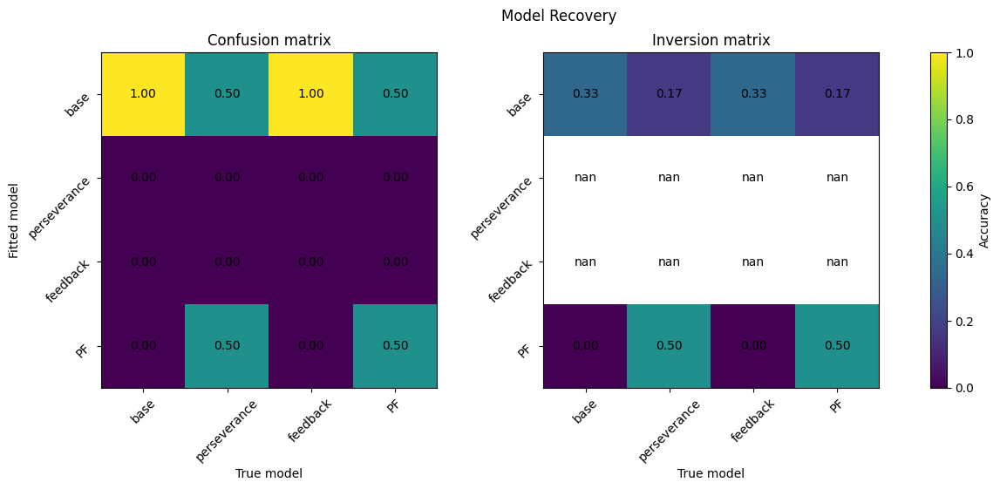

In [9]:
fig, axs = plt.subplots(1, 2, figsize=(15, 5))
fig.suptitle('Model Recovery')
plot_model_recovery(confusion_matrix, inverse_matrix, model_names, axs=axs)

## Model Comparison *(5 points)*

For this exercise you should:

*   Load and (potentially) preprocess the experimental data. (1 point)

*   Fit the two models to the data.  *(1 point)*

*   Evaluate which model performs better, taking into account fit and model complexity. *(2 points)*

*   Plot the behavior of the winning model against the data. *(1 point)**

Make sure to comment your code and provide an explanation for each code block in a preceding text block.





In [1]:
import os
import glob
import json
import random
import pandas as pd
import numpy as np
import random

from model_comparison import model_fit
from data_cleaning import clean_data

In [2]:
raw_data_dir = 'data'
cleaned_data_dir = 'data_cleaned'

# check if both directories exist, create them if they don't
os.makedirs(raw_data_dir, exist_ok=True)
os.makedirs(cleaned_data_dir, exist_ok=True)

# check the number of .jsin files in the raw_data_dir and .csv files in the cleaned_data_dir
raw_data_names = glob.glob(os.path.join(raw_data_dir, '*.json'))
cleaned_data_names = glob.glob(os.path.join(cleaned_data_dir, '*.csv'))

num_raw_data_files = len(raw_data_names)
num_cleaned_data_files = len(cleaned_data_names)

print(f'number of raw data files: {num_raw_data_files}')
print(f'number of cleaned data files: {num_cleaned_data_files}')

# if there are more raw data files than cleaned data files, clean the raw data files
# if there is duplicate names in the csv files, remove the duplicates
if num_raw_data_files > num_cleaned_data_files:
    for data_file in raw_data_names:
        with open(data_file, "r") as f:
            data = json.load(f)
        # save to csv only if the data is not already saved
        if not os.path.exists(os.path.join(cleaned_data_dir, os.path.basename(data_file).replace('.json', '.csv'))):
            df_raw = pd.json_normalize(data)
            df_clean = clean_data(df_raw) 
            df_clean.to_csv(os.path.join(cleaned_data_dir, os.path.basename(data_file).replace('.json', '.csv')), index=False)

# get the names of the cleaned data files again after possible upadting
cleaned_data_names = glob.glob(os.path.join(cleaned_data_dir, '*.csv'))
print(f'updated number of cleaned data files: {len(cleaned_data_names)}')
print("file names: ", *cleaned_data_names, sep='\n')
# load the cleaned data into dataframes
data_dfs = [pd.read_csv(data_file) for data_file in cleaned_data_names]

if len(data_dfs) == 0:
    raise ValueError("No data to fit the models")

number of raw data files: 8
number of cleaned data files: 8
updated number of cleaned data files: 8
file names: 
data_cleaned/example Alex3.csv
data_cleaned/Yehore data.csv
data_cleaned/example Alex2.csv
data_cleaned/example Val.csv
data_cleaned/example.csv
data_cleaned/example Alex4.csv
data_cleaned/example andr.csv
data_cleaned/example Alex1.csv


In [3]:
# Parameter Fitting Setup
seed = 40
random.seed(seed)

# Experiment parameters
num_trials = 100
T = 2
sigma = 0.2
tau_P = 1
x_0 = [0.5, 0.5, 0]

# Search space over parameters
num_samples = 2

min_g, max_g = 0, 5
min_c, max_c = -2, 2
min_alpha, max_alpha = -0.5, 0.5
min_gamma, max_gamma = -1, 1

c_values = np.linspace(min_c, max_c, num_samples)
g_values = np.linspace(min_g, max_g, num_samples)
alpha_values = np.linspace(min_alpha, max_alpha, num_samples)
gamma_values = np.linspace(min_gamma, max_gamma, num_samples)


# Initialize a dictionary to store the best-fitting parameters for each participant
participant_results = {}

# Initialize counters for the best fit model
model_names = ['base', 'perseverance', 'feedback', 'PF']
best_model_fit_counts = {model: 0 for model in model_names}

# Loop through each CSV file (each participant's data)
for idx, data in enumerate(data_dfs):
    print(f"\nProcessing participant {idx + 1}: {cleaned_data_names[idx]}")

    results = model_fit(data, T, x_0, g_values, c_values, alpha_values, gamma_values, sigma, tau_P, model_names)
    
    # Store the results in the dictionary
    # results is a dictoinary of the form: model_XX: {g: value, c: value, alpha: value, gamma: value, LL: value, BIC: value}
    participant_results[f"participant_{idx + 1}"] = results

    # determine which model has the lowest BIC for the current participant
    best_model = min(results, key=lambda x: results[x]['BIC'])
    best_model_fit_counts[best_model] += 1

    # Print the results for the current participant
    print(f"Participant {idx + 1} Results:")
    for model, params in results.items():
        print(f"{model}: {params}")
    print(f"Best Fit Model: {best_model}, BIC: {results[best_model]['BIC']}")
    # count best fit model sofar
    print(f"Best Fit Counts: {best_model_fit_counts}")


Processing participant 1: data_cleaned/example Alex3.csv
fitting data to models:  ['base', 'perseverance', 'feedback', 'PF']
number of data points:  74


Parallel Grid Search:   0%|          | 0/4 [00:00<?, ?it/s]

Parallel Grid Search:   0%|          | 0/8 [00:00<?, ?it/s]

Parallel Grid Search:   0%|          | 0/8 [00:00<?, ?it/s]

Parallel Grid Search:   0%|          | 0/16 [00:00<?, ?it/s]

Participant 1 Results:
base: {'g': 0.0, 'c': -2.0, 'alpha': 0.0, 'gamma': 0.0, 'LL': -51.29289136143596, 'BIC': 111.19391290928027}
perseverance: {'g': 0.0, 'c': -2.0, 'alpha': 0.0, 'gamma': -1.0, 'LL': -51.29289136143596, 'BIC': 115.49797800248444}
feedback: {'g': 0.0, 'c': -2.0, 'alpha': -0.5, 'gamma': 0.0, 'LL': -51.29289136143596, 'BIC': 115.49797800248444}
PF: {'g': 0.0, 'c': -2.0, 'alpha': -0.5, 'gamma': -1.0, 'LL': -51.29289136143596, 'BIC': 119.8020430956886}
Best Fit Model: base, BIC: 111.19391290928027
Best Fit Counts: {'base': 1, 'perseverance': 0, 'feedback': 0, 'PF': 0}

Processing participant 2: data_cleaned/Yehore data.csv
fitting data to models:  ['base', 'perseverance', 'feedback', 'PF']
number of data points:  98


Parallel Grid Search:   0%|          | 0/4 [00:00<?, ?it/s]

Parallel Grid Search:   0%|          | 0/8 [00:00<?, ?it/s]

Parallel Grid Search:   0%|          | 0/8 [00:00<?, ?it/s]

Parallel Grid Search:   0%|          | 0/16 [00:00<?, ?it/s]

Participant 2 Results:
base: {'g': 0.0, 'c': -2.0, 'alpha': 0.0, 'gamma': 0.0, 'LL': -67.9284236948747, 'BIC': 145.02678234709055}
perseverance: {'g': 0.0, 'c': -2.0, 'alpha': 0.0, 'gamma': -1.0, 'LL': -67.9284236948747, 'BIC': 149.6117498257611}
feedback: {'g': 5.0, 'c': -2.0, 'alpha': -0.5, 'gamma': 0.0, 'LL': -67.31696082654138, 'BIC': 148.38882408909447}
PF: {'g': 5.0, 'c': -2.0, 'alpha': -0.5, 'gamma': 1.0, 'LL': -65.79763365720135, 'BIC': 149.93513722908497}
Best Fit Model: base, BIC: 145.02678234709055
Best Fit Counts: {'base': 2, 'perseverance': 0, 'feedback': 0, 'PF': 0}

Processing participant 3: data_cleaned/example Alex2.csv
fitting data to models:  ['base', 'perseverance', 'feedback', 'PF']
number of data points:  94


Parallel Grid Search:   0%|          | 0/4 [00:00<?, ?it/s]

Parallel Grid Search:   0%|          | 0/8 [00:00<?, ?it/s]

Parallel Grid Search:   0%|          | 0/8 [00:00<?, ?it/s]

Parallel Grid Search:   0%|          | 0/16 [00:00<?, ?it/s]

Participant 3 Results:
base: {'g': 0.0, 'c': -2.0, 'alpha': 0.0, 'gamma': 0.0, 'LL': -65.1558349726349, 'BIC': 139.39825950980983}
perseverance: {'g': 0.0, 'c': -2.0, 'alpha': 0.0, 'gamma': -1.0, 'LL': -65.1558349726349, 'BIC': 143.94155429207981}
feedback: {'g': 0.0, 'c': -2.0, 'alpha': -0.5, 'gamma': 0.0, 'LL': -65.1558349726349, 'BIC': 143.94155429207981}
PF: {'g': 5.0, 'c': -2.0, 'alpha': 0.5, 'gamma': -1.0, 'LL': -63.19063435498385, 'BIC': 144.55444783904773}
Best Fit Model: base, BIC: 139.39825950980983
Best Fit Counts: {'base': 3, 'perseverance': 0, 'feedback': 0, 'PF': 0}

Processing participant 4: data_cleaned/example Val.csv
fitting data to models:  ['base', 'perseverance', 'feedback', 'PF']
number of data points:  96


Parallel Grid Search:   0%|          | 0/4 [00:00<?, ?it/s]

Parallel Grid Search:   0%|          | 0/8 [00:00<?, ?it/s]

Parallel Grid Search:   0%|          | 0/8 [00:00<?, ?it/s]

Parallel Grid Search:   0%|          | 0/16 [00:00<?, ?it/s]

Participant 4 Results:
base: {'g': 5.0, 'c': -2.0, 'alpha': 0.0, 'gamma': 0.0, 'LL': -51.82785724193422, 'BIC': 112.78441086680411}
perseverance: {'g': 5.0, 'c': -2.0, 'alpha': 0.0, 'gamma': -1.0, 'LL': -53.34239693486982, 'BIC': 120.37783844414315}
feedback: {'g': 5.0, 'c': -2.0, 'alpha': -0.5, 'gamma': 0.0, 'LL': -59.99405272279952, 'BIC': 133.68115002000255}
PF: {'g': 5.0, 'c': -2.0, 'alpha': 0.5, 'gamma': -1.0, 'LL': -57.83521531372356, 'BIC': 133.92782339331848}
Best Fit Model: base, BIC: 112.78441086680411
Best Fit Counts: {'base': 4, 'perseverance': 0, 'feedback': 0, 'PF': 0}

Processing participant 5: data_cleaned/example.csv
fitting data to models:  ['base', 'perseverance', 'feedback', 'PF']
number of data points:  93


Parallel Grid Search:   0%|          | 0/4 [00:00<?, ?it/s]

Parallel Grid Search:   0%|          | 0/8 [00:00<?, ?it/s]

Parallel Grid Search:   0%|          | 0/8 [00:00<?, ?it/s]

Parallel Grid Search:   0%|          | 0/16 [00:00<?, ?it/s]

Participant 5 Results:
base: {'g': 0.0, 'c': -2.0, 'alpha': 0.0, 'gamma': 0.0, 'LL': -64.46268779207496, 'BIC': 137.99057457045643}
perseverance: {'g': 0.0, 'c': -2.0, 'alpha': 0.0, 'gamma': -1.0, 'LL': -64.46268779207496, 'BIC': 142.5231740636097}
feedback: {'g': 0.0, 'c': -2.0, 'alpha': -0.5, 'gamma': 0.0, 'LL': -64.46268779207496, 'BIC': 142.5231740636097}
PF: {'g': 5.0, 'c': -2.0, 'alpha': 0.5, 'gamma': -1.0, 'LL': -55.278679321682006, 'BIC': 128.68775661597704}
Best Fit Model: PF, BIC: 128.68775661597704
Best Fit Counts: {'base': 4, 'perseverance': 0, 'feedback': 0, 'PF': 1}

Processing participant 6: data_cleaned/example Alex4.csv
fitting data to models:  ['base', 'perseverance', 'feedback', 'PF']
number of data points:  97


Parallel Grid Search:   0%|          | 0/4 [00:00<?, ?it/s]

Parallel Grid Search:   0%|          | 0/8 [00:00<?, ?it/s]

Parallel Grid Search:   0%|          | 0/8 [00:00<?, ?it/s]

Parallel Grid Search:   0%|          | 0/16 [00:00<?, ?it/s]

Participant 6 Results:
base: {'g': 0.0, 'c': -2.0, 'alpha': 0.0, 'gamma': 0.0, 'LL': -67.23527651431475, 'BIC': 143.61997498563625}
perseverance: {'g': 0.0, 'c': -2.0, 'alpha': 0.0, 'gamma': -1.0, 'LL': -67.23527651431475, 'BIC': 148.19468596413964}
feedback: {'g': 0.0, 'c': -2.0, 'alpha': -0.5, 'gamma': 0.0, 'LL': -67.23527651431475, 'BIC': 148.19468596413964}
PF: {'g': 0.0, 'c': -2.0, 'alpha': -0.5, 'gamma': -1.0, 'LL': -67.23527651431475, 'BIC': 152.76939694264303}
Best Fit Model: base, BIC: 143.61997498563625
Best Fit Counts: {'base': 5, 'perseverance': 0, 'feedback': 0, 'PF': 1}

Processing participant 7: data_cleaned/example andr.csv
fitting data to models:  ['base', 'perseverance', 'feedback', 'PF']
number of data points:  97


Parallel Grid Search:   0%|          | 0/4 [00:00<?, ?it/s]

Parallel Grid Search:   0%|          | 0/8 [00:00<?, ?it/s]

Parallel Grid Search:   0%|          | 0/8 [00:00<?, ?it/s]

Parallel Grid Search:   0%|          | 0/16 [00:00<?, ?it/s]

Participant 7 Results:
base: {'g': 5.0, 'c': -2.0, 'alpha': 0.0, 'gamma': 0.0, 'LL': -52.518141092819306, 'BIC': 114.18570414264538}
perseverance: {'g': 5.0, 'c': -2.0, 'alpha': 0.0, 'gamma': -1.0, 'LL': -54.13029355266071, 'BIC': 121.98472004083158}
feedback: {'g': 5.0, 'c': -2.0, 'alpha': -0.5, 'gamma': 0.0, 'LL': -59.92534589537123, 'BIC': 133.57482472625261}
PF: {'g': 5.0, 'c': -2.0, 'alpha': -0.5, 'gamma': -1.0, 'LL': -62.02152360781055, 'BIC': 142.34189112963463}
Best Fit Model: base, BIC: 114.18570414264538
Best Fit Counts: {'base': 6, 'perseverance': 0, 'feedback': 0, 'PF': 1}

Processing participant 8: data_cleaned/example Alex1.csv
fitting data to models:  ['base', 'perseverance', 'feedback', 'PF']
number of data points:  99


Parallel Grid Search:   0%|          | 0/4 [00:00<?, ?it/s]

Parallel Grid Search:   0%|          | 0/8 [00:00<?, ?it/s]

Parallel Grid Search:   0%|          | 0/8 [00:00<?, ?it/s]

Parallel Grid Search:   0%|          | 0/16 [00:00<?, ?it/s]

Participant 8 Results:
base: {'g': 5.0, 'c': -2.0, 'alpha': 0.0, 'gamma': 0.0, 'LL': -67.32203348924757, 'BIC': 143.83430667876434}
perseverance: {'g': 0.0, 'c': -2.0, 'alpha': 0.0, 'gamma': -1.0, 'LL': -68.62157087543464, 'BIC': 151.02850130127305}
feedback: {'g': 0.0, 'c': -2.0, 'alpha': -0.5, 'gamma': 0.0, 'LL': -68.62157087543464, 'BIC': 151.02850130127305}
PF: {'g': 5.0, 'c': -2.0, 'alpha': -0.5, 'gamma': 1.0, 'LL': -65.99149379595941, 'BIC': 150.36346699245718}
Best Fit Model: base, BIC: 143.83430667876434
Best Fit Counts: {'base': 7, 'perseverance': 0, 'feedback': 0, 'PF': 1}


In [10]:
# make a dataframe out of the participant_results
results_df = pd.DataFrame(columns=[f"{model}_{param}" for model in model_names for param in ['g', 'c', 'alpha', 'gamma', 'LL', 'BIC']])
for participant, results in participant_results.items():
    results_df.loc[participant] = [results[model][param] for model in model_names for param in ['g', 'c', 'alpha', 'gamma', 'LL', 'BIC']]


# calculate and add the average of the participants' results
results_df.loc['participants_avg'] = results_df.mean()
# round the values to 3 decimal points
results_df = results_df.astype(float).round(3)
# reoder the columns
results_df = results_df[['base_BIC', 'perseverance_BIC', 'feedback_BIC', 'PF_BIC', 'base_LL', 'perseverance_LL', 'feedback_LL', 'PF_LL',
                            'base_g', 'base_c', 'base_alpha', 'base_gamma', 
                            'perseverance_g', 'perseverance_c', 'perseverance_alpha', 'perseverance_gamma',
                            'feedback_g', 'feedback_c', 'feedback_alpha', 'feedback_gamma',
                            'PF_g', 'PF_c', 'PF_alpha', 'PF_gamma']]

# df of of final counts
best_model_fit_counts_df = pd.DataFrame(best_model_fit_counts, index=['count'])

display(best_model_fit_counts_df)
display(results_df)

,base,perseverance,feedback,PF
count,7,0,0,1


,base_BIC,perseverance_BIC,feedback_BIC,PF_BIC,base_LL,perseverance_LL,feedback_LL,PF_LL,base_g,base_c,...,perseverance_alpha,perseverance_gamma,feedback_g,feedback_c,feedback_alpha,feedback_gamma,PF_g,PF_c,PF_alpha,PF_gamma
participant_1,111.194,115.498,115.498,119.802,-51.293,-51.293,-51.293,-51.293,0.000,-2.0,...,0.0,-1.0,0.000,-2.0,-0.5,0.0,0.00,-2.0,-0.500,-1.0
participant_2,145.027,149.612,148.389,149.935,-67.928,-67.928,-67.317,-65.798,0.000,-2.0,...,0.0,-1.0,5.000,-2.0,-0.5,0.0,5.00,-2.0,-0.500,1.0
participant_3,139.398,143.942,143.942,144.554,-65.156,-65.156,-65.156,-63.191,0.000,-2.0,...,0.0,-1.0,0.000,-2.0,-0.5,0.0,5.00,-2.0,0.500,-1.0
participant_4,112.784,120.378,133.681,133.928,-51.828,-53.342,-59.994,-57.835,5.000,-2.0,...,0.0,-1.0,5.000,-2.0,-0.5,0.0,5.00,-2.0,0.500,-1.0
participant_5,137.991,142.523,142.523,128.688,-64.463,-64.463,-64.463,-55.279,0.000,-2.0,...,0.0,-1.0,0.000,-2.0,-0.5,0.0,5.00,-2.0,0.500,-1.0
participant_6,143.620,148.195,148.195,152.769,-67.235,-67.235,-67.235,-67.235,0.000,-2.0,...,0.0,-1.0,0.000,-2.0,-0.5,0.0,0.00,-2.0,-0.500,-1.0
participant_7,114.186,121.985,133.575,142.342,-52.518,-54.130,-59.925,-62.022,5.000,-2.0,...,0.0,-1.0,5.000,-2.0,-0.5,0.0,5.00,-2.0,-0.500,-1.0
participant_8,143.834,151.029,151.029,150.363,-67.322,-68.622,-68.622,-65.991,5.000,-2.0,...,0.0,-1.0,0.000,-2.0,-0.5,0.0,5.00,-2.0,-0.500,1.0
participants_avg,131.004,136.645,139.604,140.298,-60.968,-61.521,-63.001,-61.080,1.875,-2.0,...,0.0,-1.0,1.875,-2.0,-0.5,0.0,3.75,-2.0,-0.125,-0.5
